## Measure relationship between contacts and mobility metrics

#### Hypothesis
$$c(t) \propto trips(t)^2$$

Where

$$ c(t) = C(t) / N $$
$$ trips(t) = Trips(t) / N $$

- C(t) is total contacts for all users on day t 
- Trips(t) is total trips for all users on day t
- N is user panel size

So c(t) is avg contacts  per user  on day  t, and  trips(t)  is average trips per user on day t.

Note: 
- c(t) and trips(t) are restricted to the user panel
- trips measured as stays that occur outside the user personal area


#### Theory behind hypothesis
[see doc](https://docs.google.com/document/d/1h50VJ9aLLBLdaArSTAIV_MROOzM4DLzXXVdvczpaDeg/edit#)

In [1]:

import datetime
import math
import os

import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import pandas as pd
from scipy import stats

datapath = '/data/covid/'


DAY = 'day'
CONTACTS  = 'contacts'
AVG_CONTACTS = 'avg contacts'
LOG_AVG_CONTACTS = 'log avg contacts'
TRIPS = 'trips'
AVG_TRIPS = 'avg trips'
LOG_AVG_TRIPS = 'log avg trips'
SQUARE_AVG_TRIPS = 'square avg trips'


date_fmt = '%Y-%m-%d'


%config InlineBackend.figure_format = 'retina'

In [2]:
METRO_AREA = 'metro area'
PANEL_SIZE = 'panel size'
ALPHA='a'
BETA='b'

In [19]:
metro_area_to_id = {
    'New York':35620,
    'Seattle':42660,
    'Dallas':19100,
    'Washington':47900,
    'Houston':26420,
    'Chicago':16980,
    'Miami':33100,
    'LA':31080,
    'Boston':14460,
    'San Francisco':41860,
    'Philadelphia':37980,
}

In [21]:
def daterange(date1, date2):
    for n in range(int ((date2 - date1).days)+1):
        yield date1 + datetime.timedelta(n)

start_dt = datetime.date(2020, 2, 17)
end_dt = datetime.date(2020, 6, 27)

dates =  []
for dt in daterange(start_dt, end_dt):
    dates.append(dt.strftime(date_fmt))

In [5]:
def get_panel_users(area):
    panel_data_filepath = datapath + str(area) + '/' + 'homes.final.txt'
    panel_df = pd.read_csv(panel_data_filepath)
    return panel_df['user'].unique()

In [35]:
def get_contacts_trips_data(area, dates=dates):
    """
    Returns dataframe for area with columns:
    day, contacts, avg contacts, trips, avg trips
    
    days are restricted to dates
    data is restricted to area user panel 
    """
    print('handling area: %s' % area)
    contacts_path = datapath + str(area) + '/' + 'p4_with_county_data/'
    stays_path = datapath + str(area) + '/' + 'p3_output_stays_by_date_clean_personal_area/'  
    
    # Get panel users and panel size (N)
    panel_users = get_panel_users(area)
    N = len(panel_users)
    print('panel size:', N)
    
    data_dict = {
        DAY : [],
        CONTACTS: [],
        AVG_CONTACTS : [],
        TRIPS: [],
        AVG_TRIPS : [],
    }

    for date in dates:
        print('handling data for %s' % date)
        try:
            contacts_filepath = contacts_path + date + '.csv' + '.gz'
            contacts_df = pd.read_csv(contacts_filepath)
            # read stays data
            stays_filepath = stays_path + date + '.csv' + '.gz'
            stays_df = pd.read_csv(stays_filepath)
        except Exception as e:
            print('skipping date %s' % date)
            print(e)
            continue

        # restrict contacts data to user panel data where not personal area
        contacts_df = contacts_df[(contacts_df['pc1'] < 1) & (contacts_df['pc2'] < 1)]
        contacts_df = contacts_df[contacts_df['u1'].isin(panel_users) & contacts_df['u2'].isin(panel_users)]
        
        # restrict stays data to user panel data where not personal area
        stays_df = stays_df[stays_df['perc_personal_area'] < 1]
        stays_df = stays_df[stays_df['user_id'].isin(panel_users)]
        
        contacts_count = contacts_df.shape[0]
        trips_count = stays_df.shape[0]
        avg_contacts_count = float(contacts_df.shape[0])/float(N)
        avg_trips_count = float(stays_df.shape[0])/float(N)

        data_dict[DAY].append(date)
        data_dict[CONTACTS].append(contacts_count)
        data_dict[AVG_CONTACTS].append(avg_contacts_count)
        data_dict[TRIPS].append(trips_count)
        data_dict[AVG_TRIPS].append(avg_trips_count)
    df = pd.DataFrame.from_dict(data_dict)
    return df

In [36]:
def get_transformed_contacts_trips_data(area, dates=dates):
    df = get_contacts_trips_data(area, dates=dates)
    df[SQUARE_AVG_TRIPS] = df[TRIPS]**2
    df[LOG_AVG_CONTACTS] = np.log(df[AVG_CONTACTS])
    df[LOG_AVG_TRIPS] = np.log(df[AVG_TRIPS])
    return df

In [37]:
metro_area_to_data = {}

In [107]:
use_metros = [
    'Boston',
    'Dallas',
    'Seattle',
    'Washington',
    'New York',
    'Miami',
    'LA',
    # data coming soon for:
    # 'Houston'
    # Do not do SF -- data issue?
]

In [94]:
# get mapping of 
# {metro area: df}

for metro_area in use_metros:
    area_id = metro_area_to_id[metro_area]
    print('\ngetting data for metro area %s (%s)' % (metro_area, area_id))
    df = get_transformed_contacts_trips_data(area_id)
    if len(df) < 10:
        print('insufficient data for %s'% metro_area)
        continue
    metro_area_to_data[metro_area] = df


getting data for metro area Miami (33100)
handling area: 33100
('panel size:', 214833)
handling data for 2020-02-17
handling data for 2020-02-18
handling data for 2020-02-19
handling data for 2020-02-20
handling data for 2020-02-21
handling data for 2020-02-22
handling data for 2020-02-23
handling data for 2020-02-24
handling data for 2020-02-25
handling data for 2020-02-26
handling data for 2020-02-27
handling data for 2020-02-28
handling data for 2020-02-29
handling data for 2020-03-01
handling data for 2020-03-02
handling data for 2020-03-03
handling data for 2020-03-04
handling data for 2020-03-05
handling data for 2020-03-06
handling data for 2020-03-07
handling data for 2020-03-08
handling data for 2020-03-09
handling data for 2020-03-10
handling data for 2020-03-11
handling data for 2020-03-12
handling data for 2020-03-13
handling data for 2020-03-14
handling data for 2020-03-15
handling data for 2020-03-16
handling data for 2020-03-17
handling data for 2020-03-18
handling data

In [173]:
metro_area_to_data.keys()

['Dallas', 'Miami', 'Boston', 'LA', 'Washington', 'New York', 'Seattle']

In [99]:
# There is a problem with data for March 31 - remove it.
bad_date = datetime.date(2020, 3, 31).strftime(date_fmt)
print('removing from data: %s' % bad_date)
for metro_area, df in metro_area_to_data.items():
    metro_area_to_data[metro_area] = df[df[DAY]!=bad_date]

removing from data: 2020-03-31


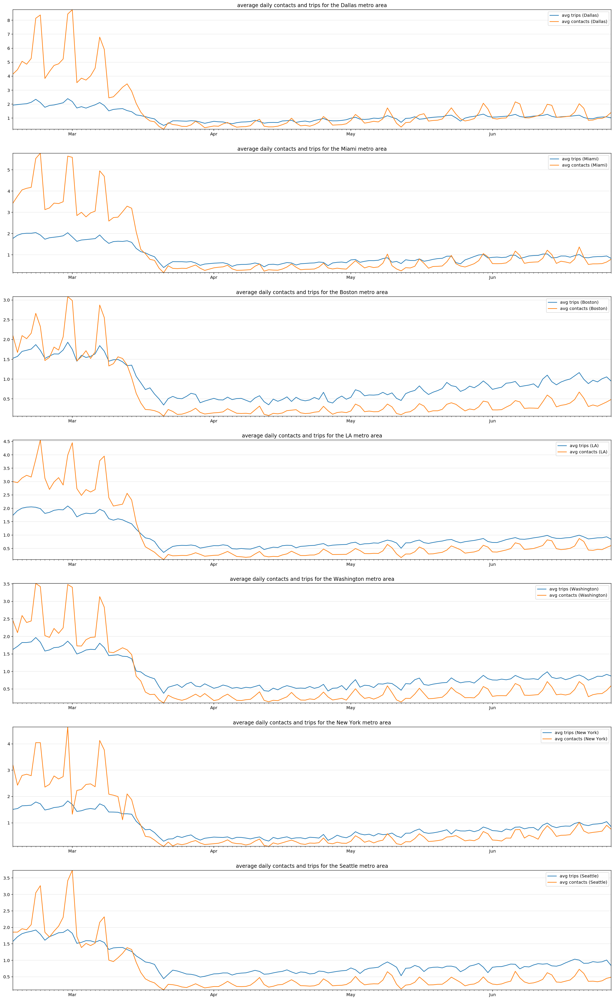

In [174]:
from matplotlib.dates import date2num, num2date
from matplotlib import dates as mdates
from matplotlib import ticker

nrows=len(metro_area_to_data)
ncols=1

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(25, nrows*6))

i=0
for metro_area, df in metro_area_to_data.items():
    ax  = axes.flat[i]
    ax.set_title('average daily contacts and trips for the %s metro area' % metro_area)
    avg_trips= df[AVG_TRIPS]
    avg_contacts = df[AVG_CONTACTS]
    index = pd.to_datetime(df[DAY])
    ax.plot(
        index,
        avg_trips.values,
        label='avg trips (%s)' % metro_area)
    ax.plot(index,
        avg_contacts,
        label='avg contacts (%s)' % metro_area)

    # Formatting
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%b'))
    ax.xaxis.set_minor_locator(mdates.DayLocator())
    ax.margins(0)
    ax.legend()
    ax.grid(which='major', axis='y', c='k', alpha=.1, zorder=-2)
    # ax.set_xlim(pd.Timestamp('2020-03-01'), data.index.get_level_values(DATE)[-1]+pd.Timedelta(days=1))
    ax.get_figure().set_facecolor('w')
    
    i+=1

In [101]:
def get_contacts_trips_filepath(area):
    return datapath + str(area) + '/contacts_trips.csv'

Save  the data because loading and  computing  it the first time takes a while

In [102]:
for metro_area, df in metro_area_to_data.items():
    area_id = metro_area_to_id[metro_area]
    contacts_trips_fpath = get_contacts_trips_filepath(area_id)
    print('saving contacts and trips data for %s (%s) to %s' % (metro_area, area_id, contacts_trips_fpath))
    df.to_csv(contacts_trips_fpath, index=False)
    print('saved')

saving contacts and trips data for Dallas (19100) to /data/covid/19100/contacts_trips.csv
saved
saving contacts and trips data for Miami (33100) to /data/covid/33100/contacts_trips.csv
saved
saving contacts and trips data for Boston (14460) to /data/covid/14460/contacts_trips.csv
saved
saving contacts and trips data for LA (31080) to /data/covid/31080/contacts_trips.csv
saved
saving contacts and trips data for Washington (47900) to /data/covid/47900/contacts_trips.csv
saved
saving contacts and trips data for New York (35620) to /data/covid/35620/contacts_trips.csv
saved
saving contacts and trips data for Seattle (42660) to /data/covid/42660/contacts_trips.csv
saved


Script re-entry point

In [103]:
metro_area_to_data = {}

In [109]:
for metro_area in use_metros:
    area_id = metro_area_to_id[metro_area]
    contacts_trips_fpath = get_contacts_trips_filepath(area_id)
    df = pd.read_csv(contacts_trips_fpath)
    metro_area_to_data[metro_area] = df
    print('loaded previously saved data for %s (%s)' % (metro_area, area_id))
    
df.head()

loaded previously saved data for Boston (14460)
loaded previously saved data for Dallas (19100)
loaded previously saved data for Seattle (42660)
loaded previously saved data for Washington (47900)
loaded previously saved data for New York (35620)
loaded previously saved data for Miami (33100)
loaded previously saved data for LA (31080)


,avg contacts,avg trips,contacts,day,trips,square avg trips,log avg contacts,log avg trips
0,2.997806,1.740297,966145,2020-02-17,560870,314575156900,1.097881,0.554056
1,2.959539,1.910936,953812,2020-02-18,615864,379288466496,1.085033,0.647593
2,3.133587,2.005706,1009905,2020-02-19,646407,417842009649,1.142178,0.695996
3,3.233366,2.042199,1042062,2020-02-20,658168,433185116224,1.173524,0.714027
4,3.169171,2.053087,1021373,2020-02-21,661677,437816452329,1.153470,0.719344


In [110]:
df.head()

,avg contacts,avg trips,contacts,day,trips,square avg trips,log avg contacts,log avg trips
0,2.997806,1.740297,966145,2020-02-17,560870,314575156900,1.097881,0.554056
1,2.959539,1.910936,953812,2020-02-18,615864,379288466496,1.085033,0.647593
2,3.133587,2.005706,1009905,2020-02-19,646407,417842009649,1.142178,0.695996
3,3.233366,2.042199,1042062,2020-02-20,658168,433185116224,1.173524,0.714027
4,3.169171,2.053087,1021373,2020-02-21,661677,437816452329,1.153470,0.719344


We observe $c(t) \propto trips(t)^2$ as the correlation between $c(t)$ and $trips(t)^2$

Dallas
correlation: 0.969


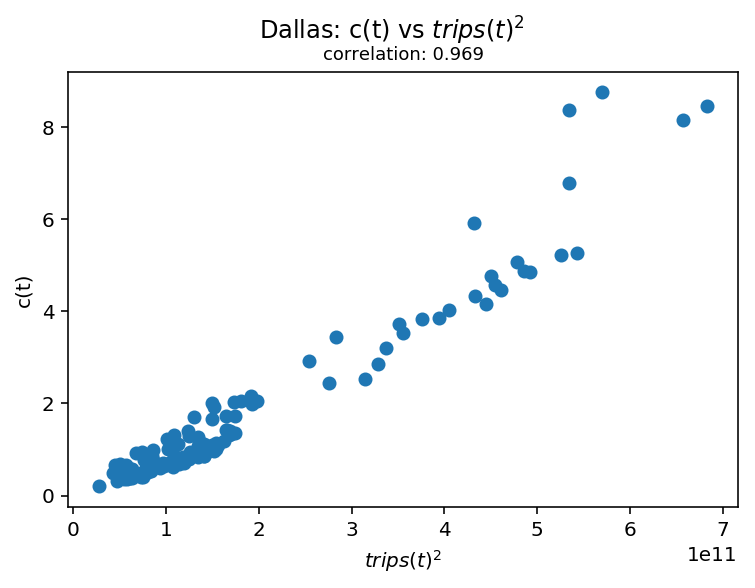

Miami
correlation: 0.969


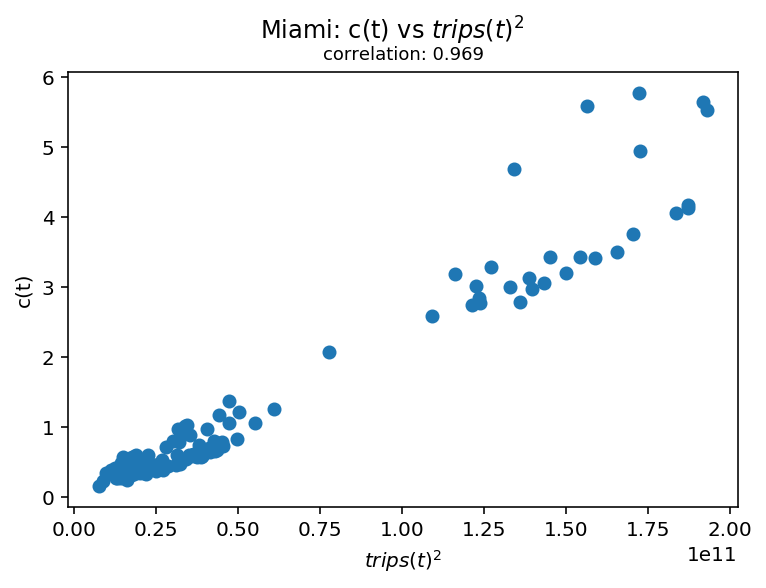

Boston
correlation: 0.974


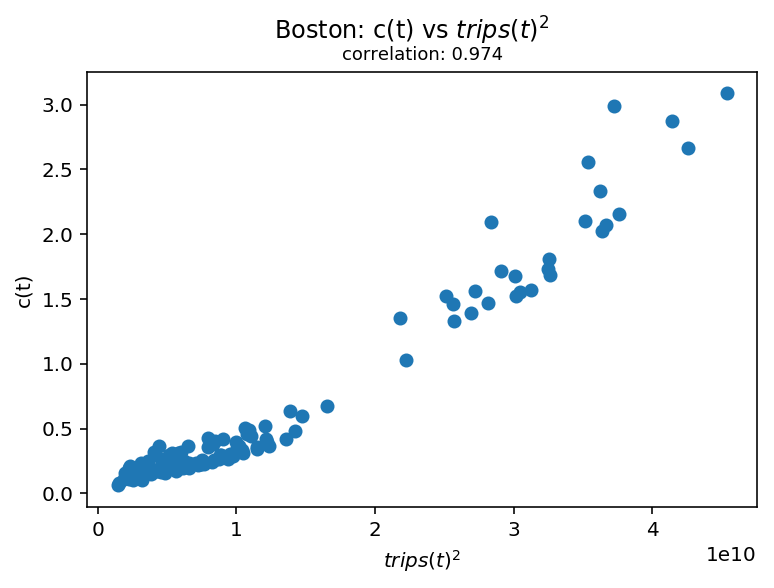

LA
correlation: 0.980


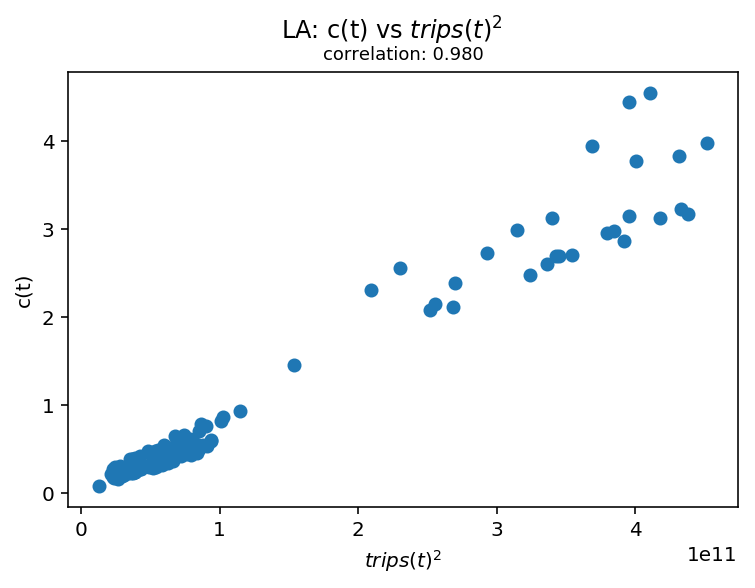

Washington
correlation: 0.978


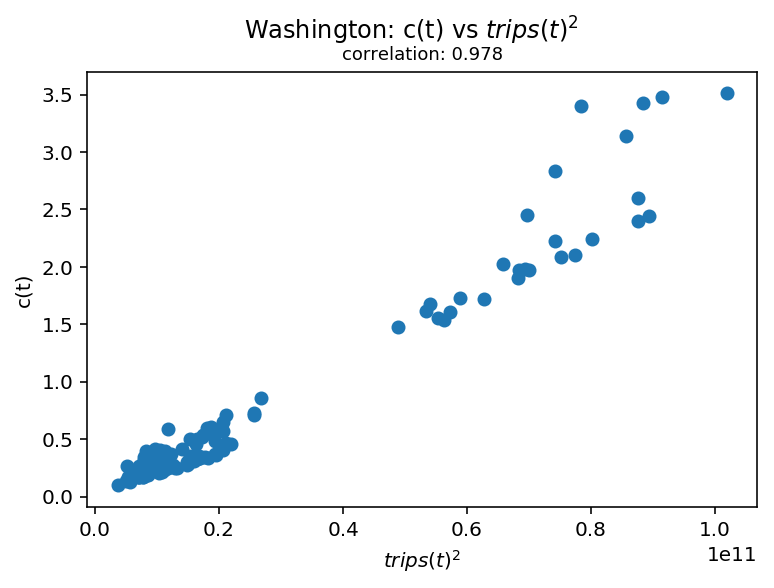

New York
correlation: 0.963


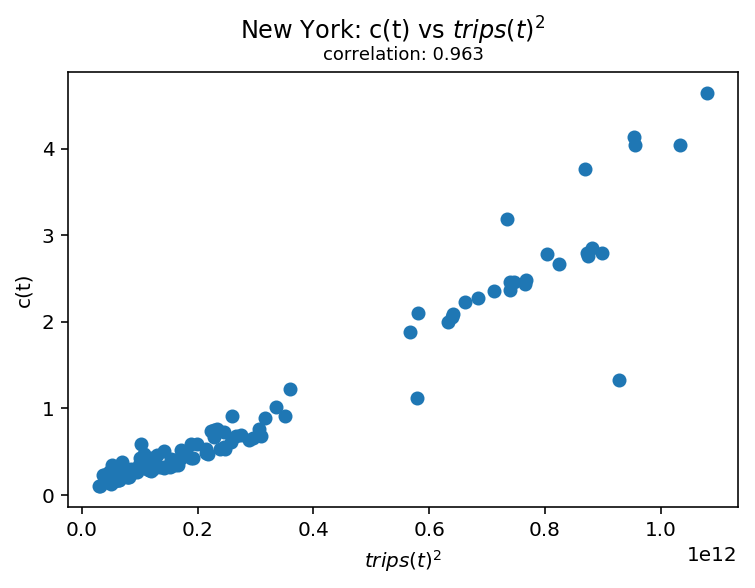

Seattle
correlation: 0.947


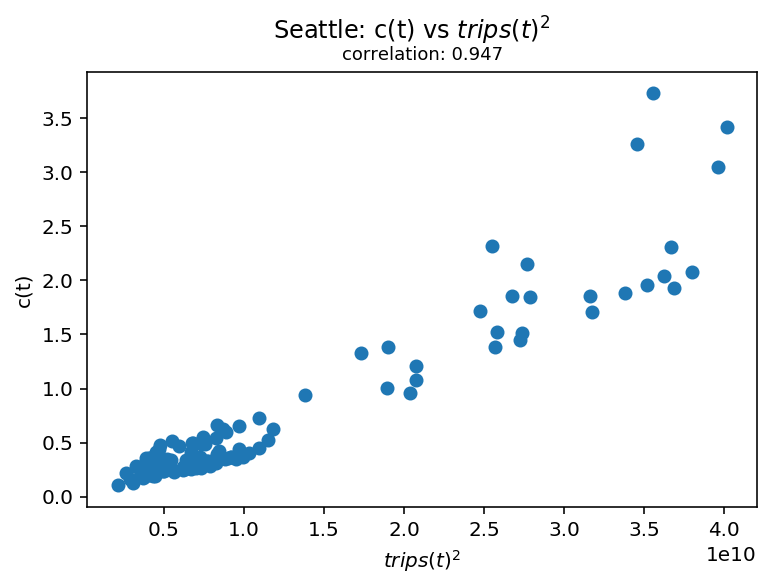

In [111]:

for metro_area, df in metro_area_to_data.items():
    avg_contacts  = df[AVG_CONTACTS]
    sq_avg_trips = df[SQUARE_AVG_TRIPS]
    correlation = avg_contacts.corr(sq_avg_trips)
    print(metro_area)
    print('correlation: %.3f' % round(correlation, 3))
    plt.scatter(
        sq_avg_trips,
        avg_contacts,
    )
    plt.xlabel("$trips(t)^2$")
    plt.ylabel("c(t)")
    
    plt.suptitle('%s: c(t) vs $trips(t)^2$'  % (metro_area), fontsize=12)
    plt.title('correlation: %.3f' % round(correlation, 3), fontsize=9)
    plt.show()
    

## Regression to evaluate theory


Is 2 the right power for this model?

We run regressions to estimate coefficients, a, b, for the model

$contacts(t)$ = $a$ x $trips(t) ^b$

More specifically

$log( contacts(t) )$  = $log (a)$ + $b$ x $log( trips(t))$

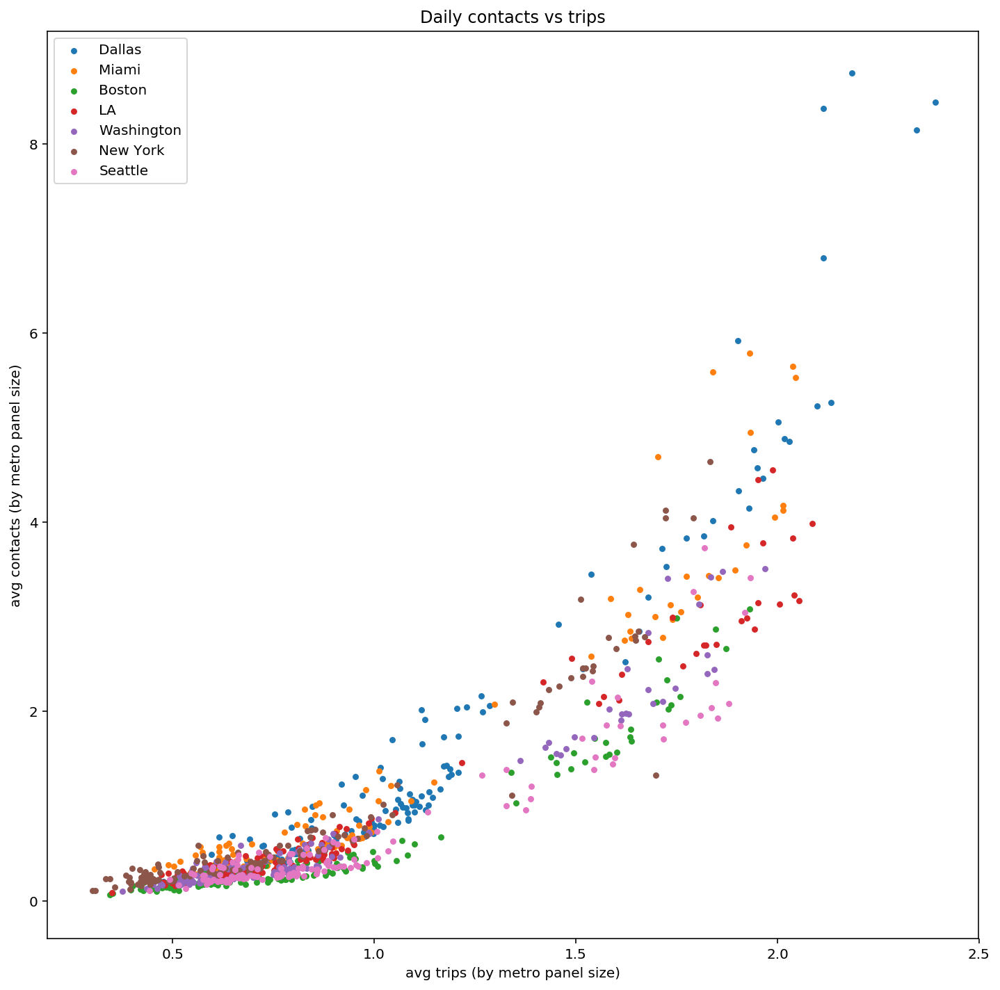

In [112]:
figure, ax = plt.subplots(figsize=(12, 12))
s=12

for metro_area,df in metro_area_to_data.items():
    x = df[AVG_TRIPS]
    y = df[AVG_CONTACTS]
    ax.scatter(
        x,
        y,
        s=12,
        label=metro_area,
    )
ax.set_xlabel("avg trips (by metro panel size)")
ax.set_ylabel("avg contacts (by metro panel size)")
title = 'Daily contacts vs trips'
ax.set_title(title)
plt.legend()
plt.show()

In [113]:

def regression_plot(ax, metro_area, df, with_sq_line=True):
    y=df[LOG_AVG_CONTACTS]
    x = df[LOG_AVG_TRIPS]
    b, log_a, r_value, p_value, std_err = stats.linregress(x.values,y)
    a = math.exp(log_a)
    r_sq = r_value**2 
    CI_95 = [b - 1.960*std_err, b + 1.960*std_err]

    # plot transformed outputs
    ax.scatter(
        df[AVG_TRIPS],
        df[AVG_CONTACTS],
        color='black',
        s=18, # marker size
        label='_nolegend_',
    )
    y_pred = a * (df[AVG_TRIPS]**b)
    sorted_x = df[AVG_TRIPS].sort_values()
    sorted_y_pred = y_pred.sort_values()
    ax.plot(
        sorted_x,
        sorted_y_pred,
        c='gray', zorder=1, alpha=.95, linewidth=2,
        label='b = %.2f'%b,
    )
    if with_sq_line:
        
        # then also do  regression with a = 2
        # contacts = b * trips^2
        x2 = df[AVG_TRIPS]**2
        y2 = df[AVG_CONTACTS]
        a2, intercept, r_value, p_value, std_err = stats.linregress(x2.values,y2.values)
        y_pred2 = intercept + a2*(df[AVG_TRIPS]**2)
        sorted_x2 = df[AVG_TRIPS].sort_values()
        sorted_y_pred2 = y_pred2.sort_values()
        # sq line
        ax.plot(
            sorted_x2,
            sorted_y_pred2,
            c='purple', zorder=1, alpha=.95, linewidth=2,
            label='b = 2'
        )
        ax.legend(loc='upper left')
    title = ('  %s\n' + \
            '  contacts(t) = a x $trips(t)^b$\n' + \
            '  b = %.2f (95%% CI %.2f to %.2f); a = %.2f; $R^2$ = %.2f') \
             % (metro_area, round(b,3), CI_95[0], CI_95[1],round(a,3), round(r_sq,3))
    ax.set_title(title,
                 loc='left', # left align
                 fontdict={'fontsize':16},
                )
    ax.set_xlabel('trips(t)',fontsize=15)
    ax.set_ylabel('contacts(t)',fontsize=15)
    
    ax.spines['top'].set_visible(True)
    ax.spines['right'].set_visible(True)
    ax.margins(0.05)
    ax.get_figure().set_facecolor('w')

    return (b, a, r_sq, CI_95)

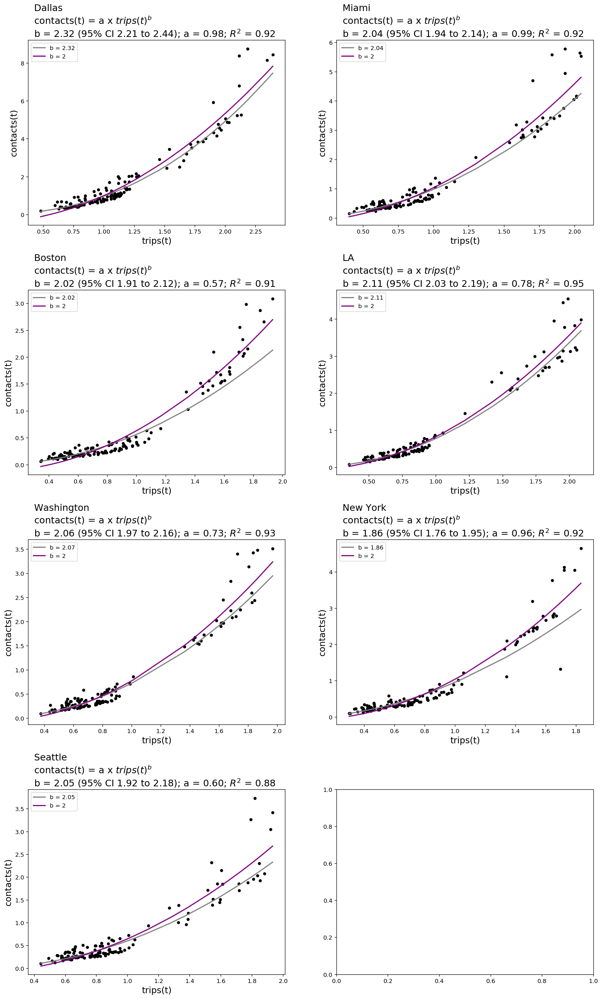

In [116]:
ncols = 2
nrows = int(np.ceil(float(len(metro_area_to_data)) / float(ncols)))
figure, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, nrows*6))
plt.subplots_adjust(hspace=0.5)


for i, (metro_area, df) in enumerate(metro_area_to_data.items()):
    (b, a, r_square_score, CI_95) = regression_plot(axes.flat[i], metro_area, df)
    
plt.tight_layout()
plt.show()

## Compare before vs after March 14 2020 lockdown


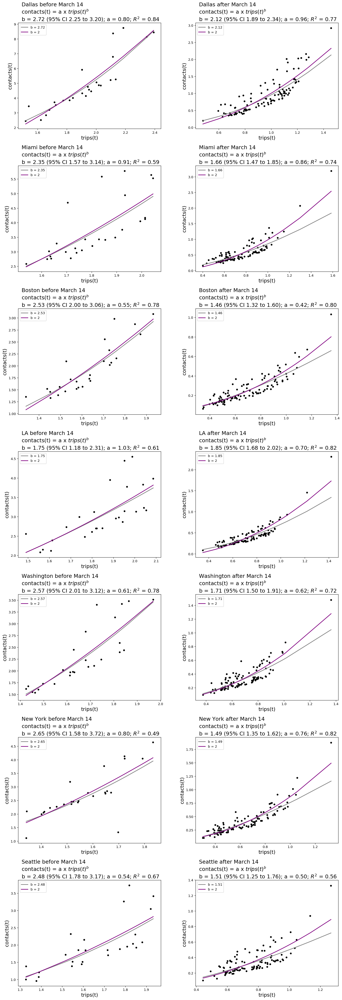

In [117]:
ncols = 2
nrows = int(np.ceil(float(len(metro_area_to_data))))
figure, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, nrows*6))
plt.subplots_adjust(hspace=0.5)

for i, (metro_area, df) in enumerate(metro_area_to_data.items()):
    before_lockdown_df = df[df[DAY] < '2020-03-14']
    after_lockdown_df = df[df[DAY] >= '2020-03-14']
    before_name = '%s before March 14' % metro_area
    after_name = '%s after March 14' % metro_area
    (before_b, before_a, before_r_sq, before_CI_95) = regression_plot(axes.flat[2*i], before_name, before_lockdown_df)
    (after_b, after_a, after_r_sq, after_CI_95) = regression_plot(axes.flat[2*i+1], after_name, after_lockdown_df)

plt.tight_layout()
plt.show()

## Compare 3  time periods

up to March 13 vs March 14 - April 14 vs After April 14 


In [118]:
date1 = '2020-03-14'
date2 = '2020-04-25'

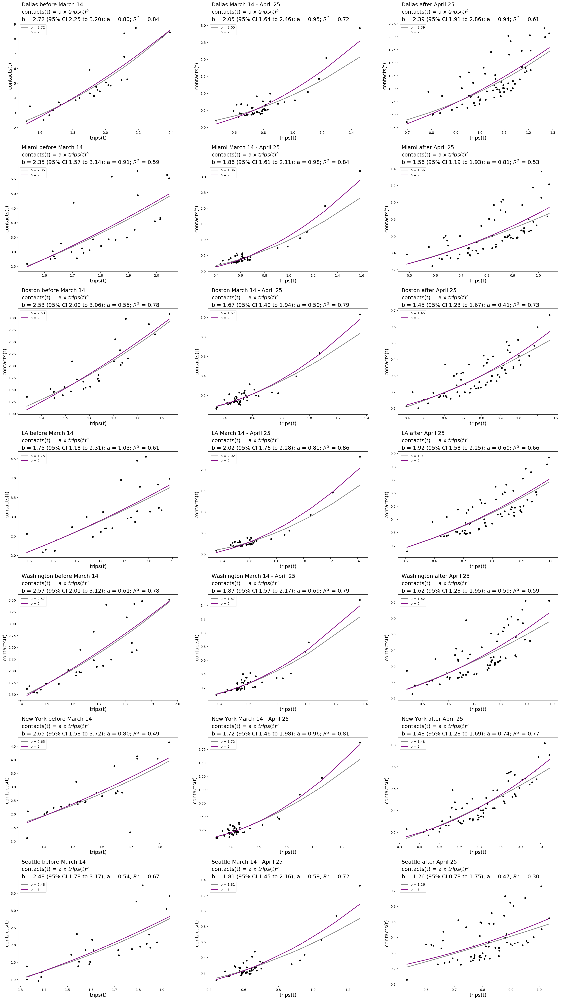

In [119]:
ncols = 3
nrows = int(np.ceil(float(len(metro_area_to_data))))
figure, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(24, nrows*6))
plt.subplots_adjust(hspace=0.5)

def f_date(date):
    return datetime.datetime.strptime(date, date_fmt).strftime("%B %d")

for i, (metro_area, df) in enumerate(metro_area_to_data.items()):
    p1_df = df[df[DAY] < date1]
    p2_df = df[(df[DAY] >= date1) & (df[DAY] < date2)]
    p3_df = df[(df[DAY] >= date2)]
    
    p1_name = '%s before %s' % (metro_area, f_date(date1))
    p2_name = '%s %s - %s' % (metro_area, f_date(date1), f_date(date2))
    p3_name = '%s after %s' % (metro_area, f_date(date2))
    (p1_b, p1_a, p1_r_sq, p1_CI_95) = regression_plot(axes.flat[3*i], p1_name, p1_df)
    (p2_b, p2_a, p2_r_sq, p2_CI_95) = regression_plot(axes.flat[3*i+1], p2_name, p2_df)
    if len(p3_df):
        (p3_b, p3_a, p3_r_sq, p3_CI_95) = regression_plot(axes.flat[3*i+2], p3_name, p3_df)

plt.tight_layout()
plt.show()

# Inspect Weekends  vs Weekdays behavior

Question: Was there weekend behavior that went away with social distancing?

In [120]:
def plot_weekend_vs_weekday_df(metro_df, name, ax, color='blue'):
    """"""
    # isoweekday: Monday is 1. Sunday is 7.
    metro_weekdays_df = metro_df[pd.to_datetime(metro_df[DAY]).apply(lambda d: d.isoweekday() in range(1,6))]
    wd = ax.scatter(
        metro_weekdays_df[AVG_TRIPS],
        metro_weekdays_df[AVG_CONTACTS],
        s=16,
        label='%s weekdays' % name,
    )
    # only weekends (remove commuting)
    metro_weekends_df = metro_df[pd.to_datetime(metro_df[DAY]).apply(lambda d: d.isoweekday() in [6,7])]
    we = ax.scatter(
        metro_weekends_df[AVG_TRIPS],
        metro_weekends_df[AVG_CONTACTS],
        s=16,
        label='%s weekends' % name,
    )
    
    we.set_color(color)
    wd.set_color(color)
    wd.set_alpha(0.4)
    
    ax.set_title('%s\nweekdays vs weekends'% name,
        loc='left', # left align
        fontdict={'fontsize':16},
    )
    ax.set_xlabel("avg trips(t)")
    ax.set_ylabel("avg contacts(t)")
    ax.legend()
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    #ax.margins(0.05)
    ax.get_figure().set_facecolor('w')
        

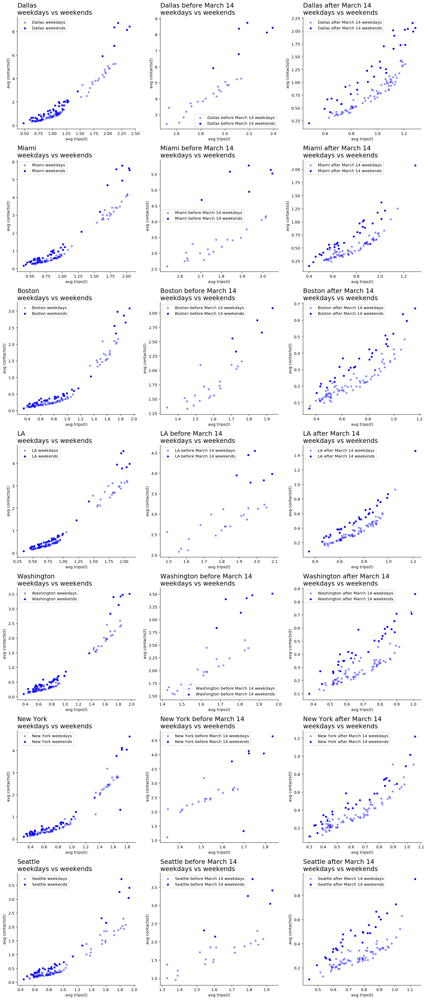

In [121]:
ncols = 3
nrows = len(metro_area_to_data)
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, nrows*5))
plt.subplots_adjust(hspace=0.5)

for i, (metro_area, metro_df) in enumerate(metro_area_to_data.items()):
    [ax1,ax2,ax3] = [axes.flat[3*i],axes.flat[3*i+1], axes.flat[3*i+2]]
    # ax1: all together
    plot_weekend_vs_weekday_df(metro_df, metro_area, ax1)
    # excluding  March 14 which is an outlier
    before_lockdown_df = metro_df[metro_df[DAY] < '2020-03-14']
    after_lockdown_df = metro_df[metro_df[DAY] > '2020-03-14']
    plot_weekend_vs_weekday_df(before_lockdown_df, '%s before March 14'%metro_area, ax2)
    plot_weekend_vs_weekday_df(after_lockdown_df, '%s after March 14'%metro_area, ax3)
    
   
plt.tight_layout()
plt.show()

In [131]:
# Put all metros  in a dataframe together

metro_contacts_trips = None

for metro_area,df in metro_area_to_data.items():
    df[METRO_AREA]=metro_area
    if metro_contacts_trips is None:
        metro_contacts_trips = df
    else:
        metro_contacts_trips=metro_contacts_trips.append(df)

In [132]:
print(metro_contacts_trips.shape)
metro_contacts_trips.head()

(917, 9)


,avg contacts,avg trips,contacts,day,trips,square avg trips,log avg contacts,log avg trips,metro area
0,4.151473,1.929250,1435210,2020-02-17,666963,444839643369,1.423463,0.657131,Dallas
1,4.464680,1.964734,1543489,2020-02-18,679230,461353392900,1.496198,0.675357,Dallas
2,5.063246,2.001602,1750420,2020-02-19,691976,478830784576,1.622008,0.693948,Dallas
3,4.856409,2.030271,1678914,2020-02-20,701887,492645360769,1.580299,0.708169,Dallas
4,5.265580,2.132455,1820369,2020-02-21,737213,543483007369,1.661191,0.757274,Dallas


('a', 0.7968230230888093, 'b', 2.078901687773277, [2.0281202514930134, 2.1296831240535408], 'r-sq', 0.8755657906217733)
['Dallas', 'Miami', 'Boston', 'LA', 'Washington', 'New York', 'Seattle']


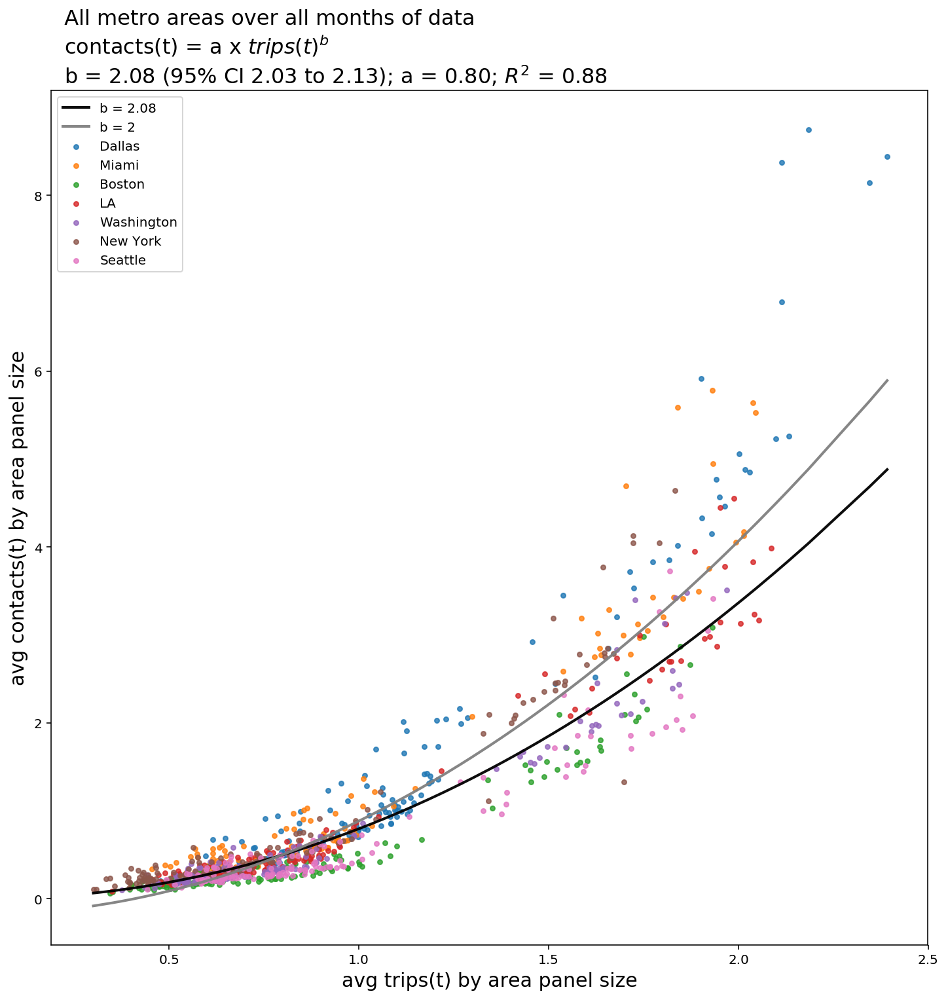

(0.7968230230888093,
 2.078901687773277,
 [2.0281202514930134, 2.1296831240535408],
 0.8755657906217733)

In [175]:


def regression_and_plot_multi_metro(df, over_time_period='all months of data'):
    figure, ax = plt.subplots(figsize=(12, 12))
    marker_size=12
    y=df[LOG_AVG_CONTACTS]
    x = df[LOG_AVG_TRIPS]
    b, log_a, r_value, p_value, std_err = stats.linregress(x.values,y)
    a = math.exp(log_a)
    r_sq = r_value**2 
    CI_95 = [b - 1.960*std_err, b + 1.960*std_err]

    print('a',a,'b',b,CI_95,'r-sq',r_sq)

    # plot transformed outputs
    metros=df[METRO_AREA].unique().tolist()
    print(metros)
    for metro_area in metros:
        m_df = df[df[METRO_AREA]==metro_area]
        x = m_df[AVG_TRIPS]
        y = m_df[AVG_CONTACTS]
        ax.scatter(
            x,
            y,
            s=marker_size,
            label=metro_area,
            alpha=0.8,
        )

    y_pred = a * (df[AVG_TRIPS]**b)
    sorted_x = df[AVG_TRIPS].sort_values()
    sorted_y_pred = y_pred.sort_values()
    ax.plot(
        sorted_x,
        sorted_y_pred,
        c='black', zorder=1, alpha=.95, linewidth=2,
        label='b = %.2f'%b,
    )

    # then also do  regression with a = 2
    # contacts = b * trips^2
    x2 = df[AVG_TRIPS]**2
    y2 = df[AVG_CONTACTS]
    a2, intercept, r_value, p_value, std_err = stats.linregress(x2.values,y2.values)
    y_pred2 = intercept + a2*(df[AVG_TRIPS]**2)
    sorted_x2 = df[AVG_TRIPS].sort_values()
    sorted_y_pred2 = y_pred2.sort_values()
    # sq line
    ax.plot(
        sorted_x2,
        sorted_y_pred2,
        c='gray', zorder=1, alpha=.95, linewidth=2,
        label='b = 2'
    )
    ax.legend(loc='upper left')
    title = ('  All metro areas over %s\n' + \
            '  contacts(t) = a x $trips(t)^b$\n' + \
            '  b = %.2f (95%% CI %.2f to %.2f); a = %.2f; $R^2$ = %.2f') \
             % (over_time_period,round(b,3), CI_95[0], CI_95[1],round(a,3), round(r_sq,3))
    ax.set_title(title,
                 loc='left', # left align
                 fontdict={'fontsize':16},
                )
    ax.set_xlabel('avg trips(t) by area panel size',fontsize=15)
    ax.set_ylabel('avg contacts(t) by area panel size',fontsize=15)

    ax.spines['top'].set_visible(True)
    ax.spines['right'].set_visible(True)
    ax.margins(0.05)
    ax.get_figure().set_facecolor('w')
    plt.show()
    return (a,b,CI_95,r_sq)

regression_and_plot_multi_metro(metro_contacts_trips,over_time_period='all months of data')


In [134]:
MONTH = 'month'
MONTH_NAME = 'month name'
metro_contacts_trips[MONTH] = pd.to_datetime(metro_contacts_trips[DAY],format=date_fmt).apply(lambda d: d.month)
metro_contacts_trips.head(2)

,avg contacts,avg trips,contacts,day,trips,square avg trips,log avg contacts,log avg trips,metro area,month
0,4.151473,1.929250,1435210,2020-02-17,666963,444839643369,1.423463,0.657131,Dallas,2
1,4.464680,1.964734,1543489,2020-02-18,679230,461353392900,1.496198,0.675357,Dallas,2


In [135]:
ALPHA='a'
BETA='b'
BETA_95CI_LOW='b 95 CI low'
BETA_95CI_HIGH='b 95 CI high'
R_SQ='r-sq'

February
('a', 0.5177889348448201, 'b', 2.9538607796454626, [2.438797430929496, 3.468924128361429], 'r-sq', 0.5867168638223496)
['Dallas', 'Miami', 'Boston', 'LA', 'Washington', 'New York', 'Seattle']


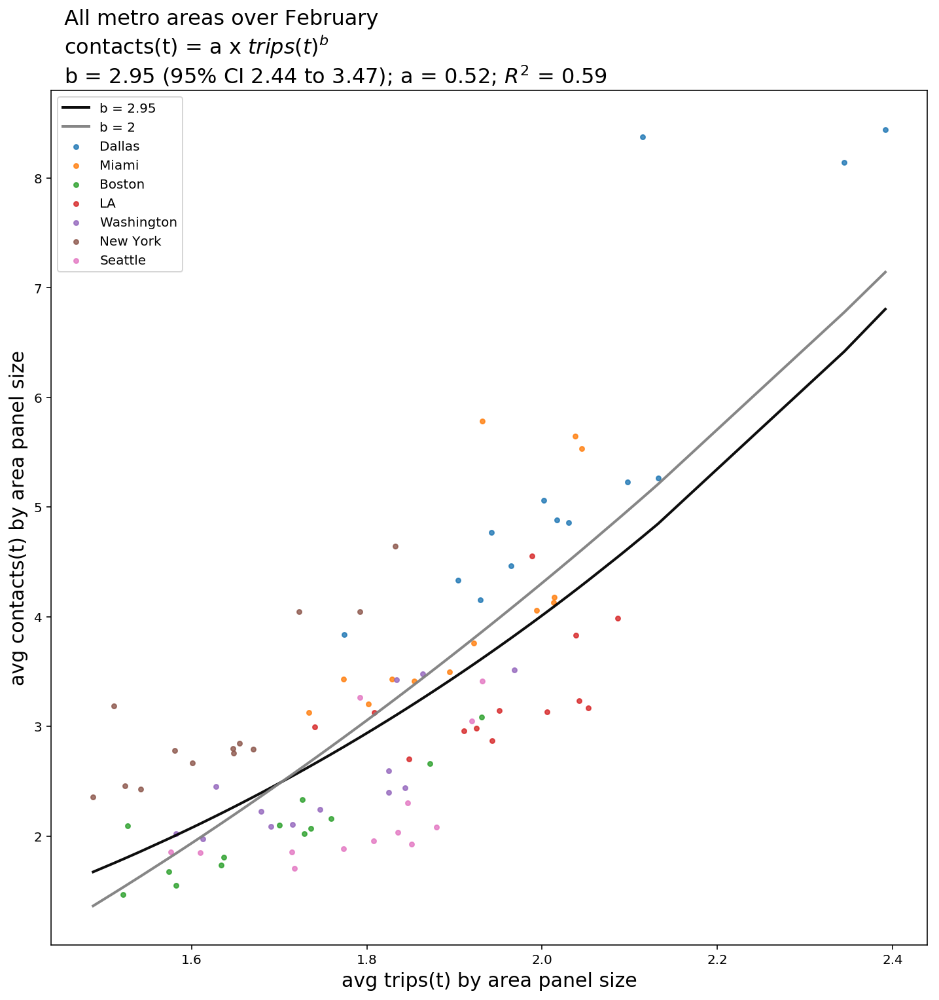

March
('a', 0.8347737409575517, 'b', 2.146453541572202, [2.059761584043388, 2.233145499101016], 'r-sq', 0.9188462362697452)
['Dallas', 'Miami', 'Boston', 'LA', 'Washington', 'New York', 'Seattle']


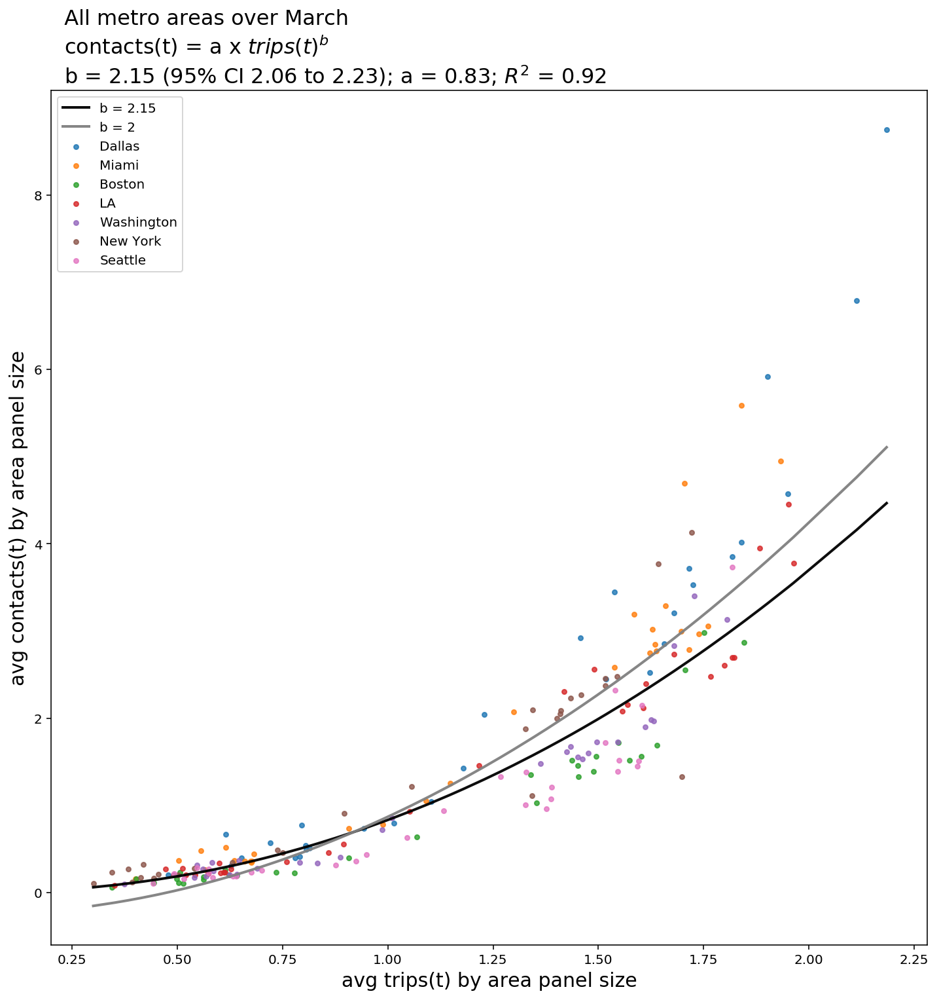

April
('a', 0.7136603633703771, 'b', 1.6602284716560287, [1.4523330008490951, 1.8681239424629623], 'r-sq', 0.5408341159970741)
['Dallas', 'Miami', 'Boston', 'LA', 'Washington', 'New York', 'Seattle']


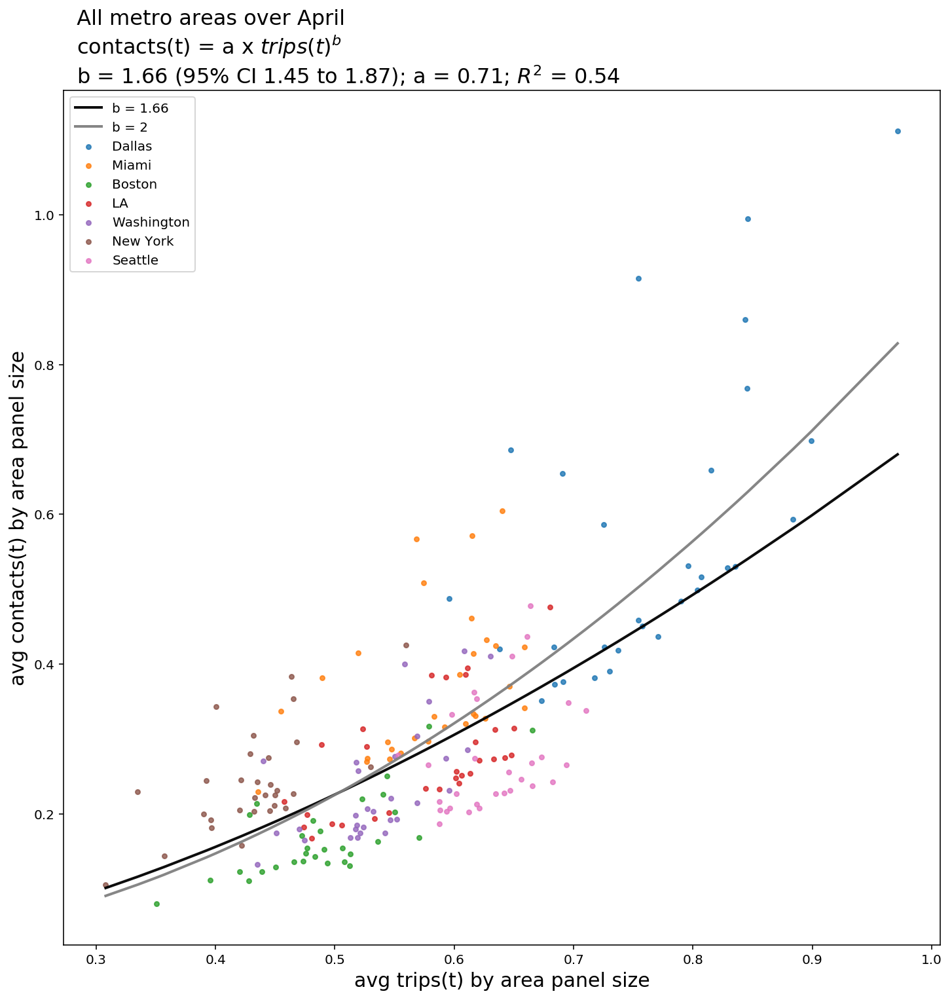

May
('a', 0.7574054993984561, 'b', 2.1346380926266546, [1.91074684380722, 2.358529341446089], 'r-sq', 0.6189360725612735)
['Dallas', 'Miami', 'Boston', 'LA', 'Washington', 'New York', 'Seattle']


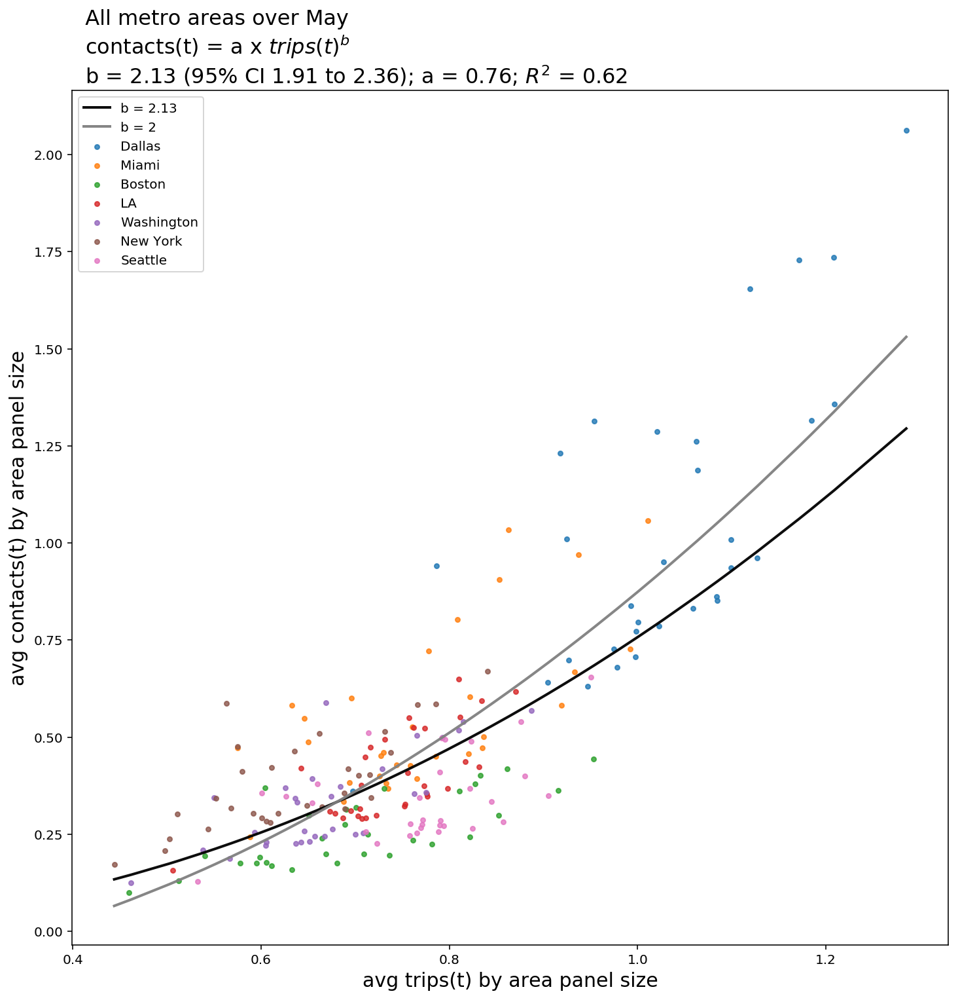

In [127]:
# same thing as above but for multiple months
# and  make a   dataframe with columns:
# month,month name,a,b,b_95CI_low,b_95CI_high,r_sq


all_months_regression_values = []
month_ints  = [2,3,4,5]
for month_int in month_ints:
    d = datetime.date(2020, month_int, 1)
    month = d.strftime('%B')
    print(month)
    month_df = metro_contacts_trips[metro_contacts_trips[MONTH]==month_int]
    (a,b,CI_95,r_sq)  = regression_and_plot_multi_metro(month_df,over_time_period=month)
    month_regression_values = {
        MONTH:month_int,
        MONTH_NAME:month,
        ALPHA:a,
        BETA:b,
        BETA_95CI_LOW:CI_95[0],
        BETA_95CI_HIGH:CI_95[1],
        R_SQ:r_sq,
    }
    all_months_regression_values += [month_regression_values]


February
('a', 0.6166247218911806, 'b', 2.7157136096280903, [2.141732753391461, 3.2896944658647196], 'r-sq', 0.5308566356129457)
['Dallas', 'Miami', 'LA', 'Washington', 'New York', 'Seattle']


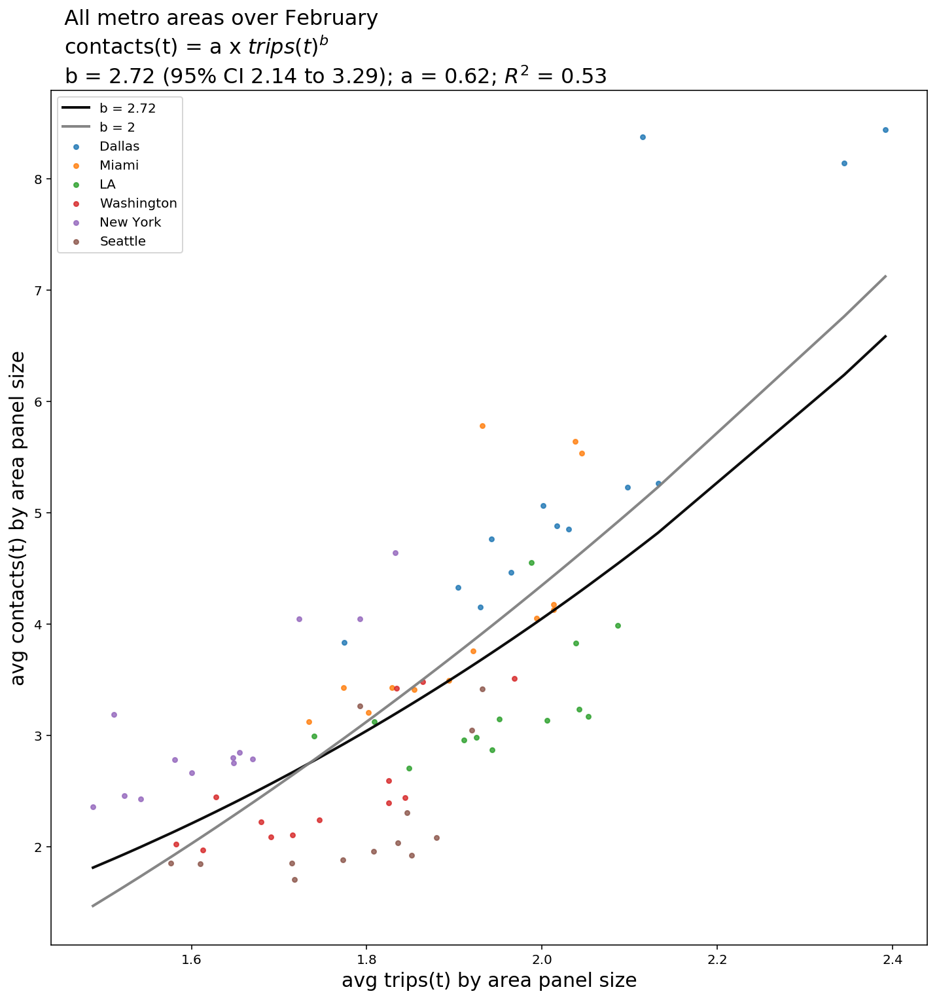

March
('a', 0.8764828473917902, 'b', 2.124345694864045, [2.0334605902317904, 2.2152307994962994], 'r-sq', 0.9218211016564309)
['Dallas', 'Miami', 'LA', 'Washington', 'New York', 'Seattle']


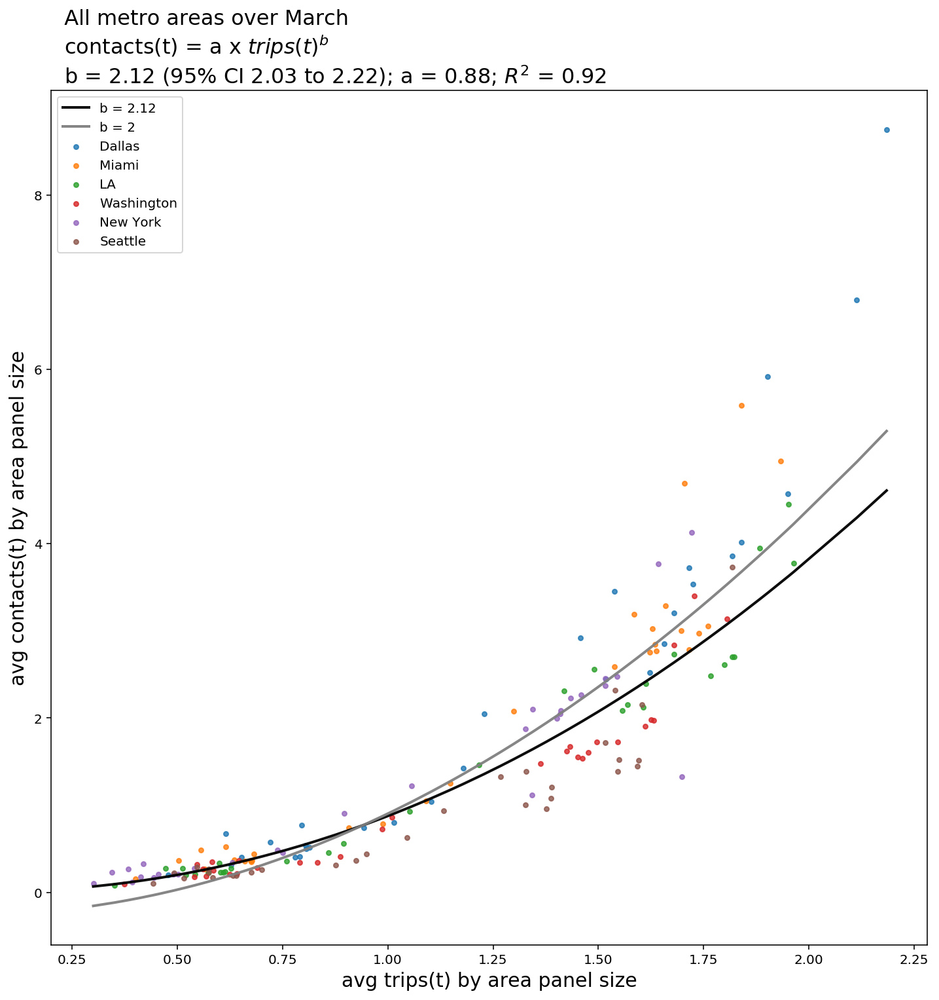

April
('a', 0.6647319559580405, 'b', 1.4439817467771845, [1.2313696117485657, 1.6565938818058032], 'r-sq', 0.4988714185656788)
['Dallas', 'Miami', 'LA', 'Washington', 'New York', 'Seattle']


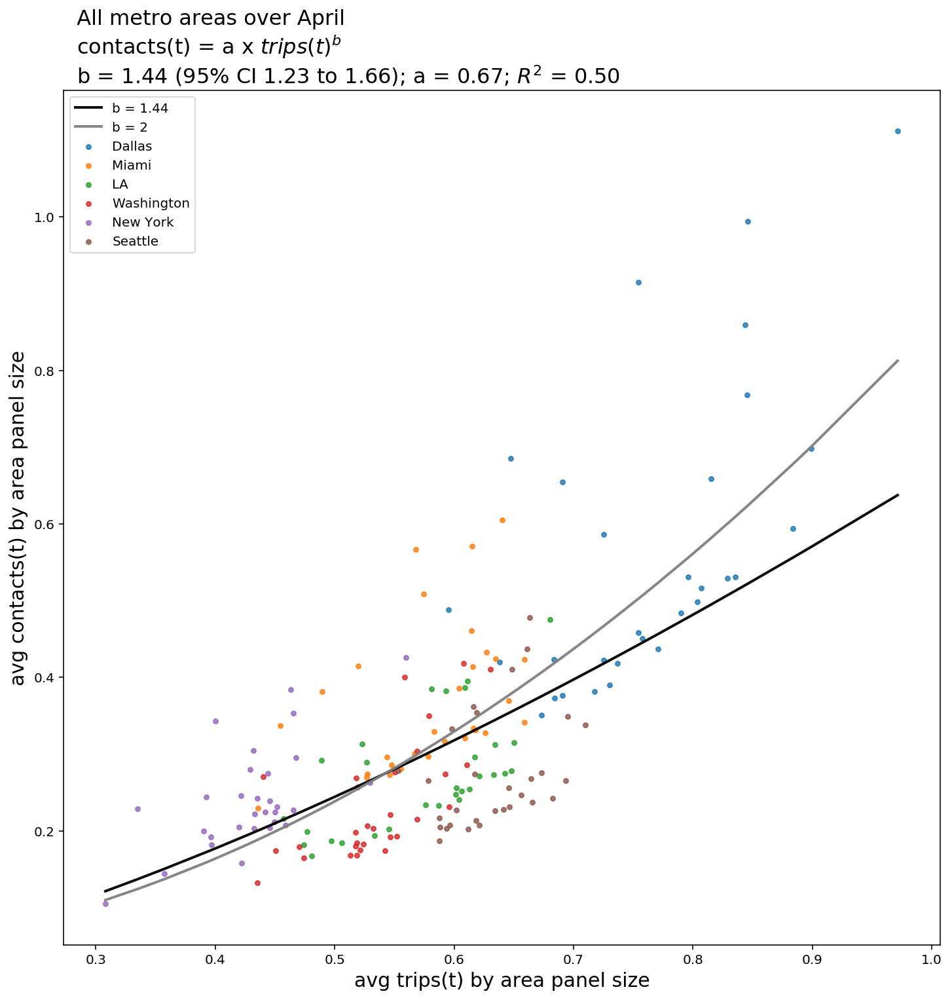

May
('a', 0.7867579484228626, 'b', 2.0600021661822514, [1.8377788227418508, 2.282225509622652], 'r-sq', 0.6421049461689489)
['Dallas', 'Miami', 'LA', 'Washington', 'New York', 'Seattle']


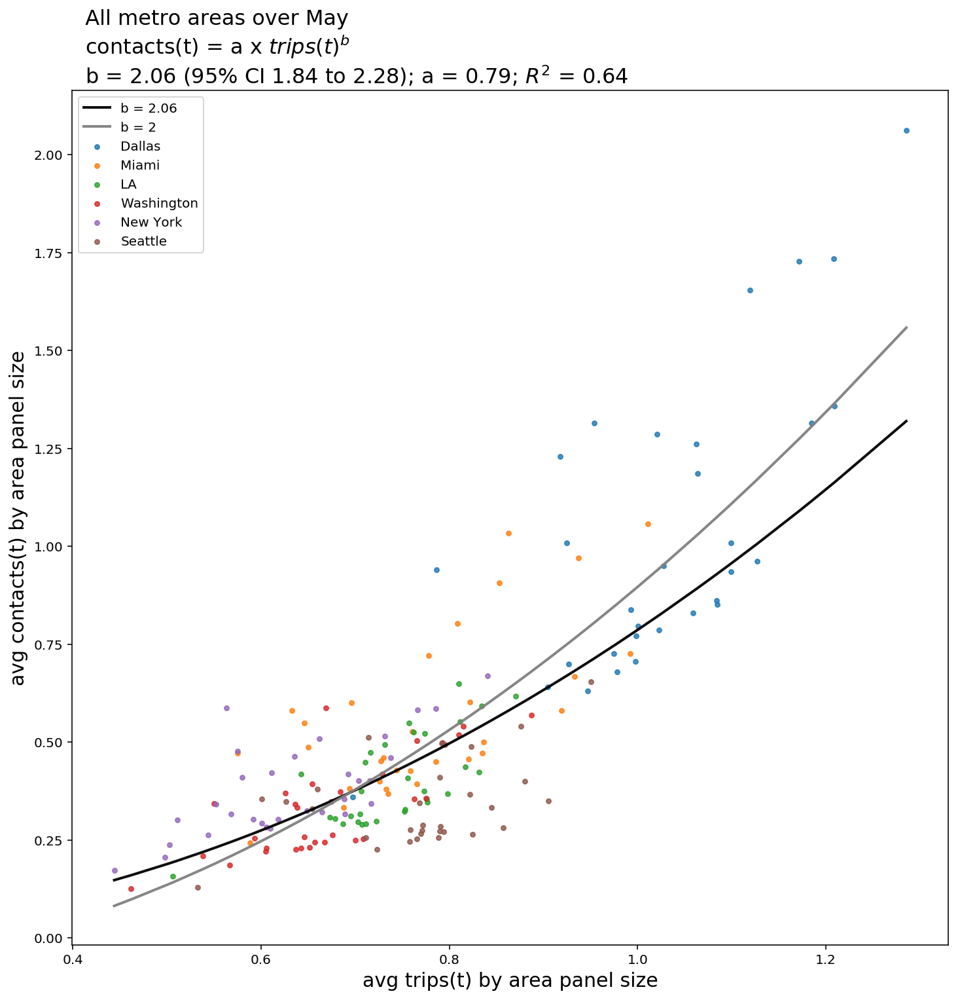

In [128]:
# how  about without Boston?
no_boston = metro_contacts_trips[metro_contacts_trips[METRO_AREA]!='Boston']
no_boston_all_months_regression_values = []
month_ints  = [2,3,4,5]
for month_int in month_ints:
    d = datetime.date(2020, month_int, 1)
    month = d.strftime('%B')
    print(month)
    month_df = no_boston[no_boston[MONTH]==month_int]
    (a,b,CI_95,r_sq)  = regression_and_plot_multi_metro(month_df,over_time_period=month)
    month_regression_values = {
        MONTH:month_int,
        MONTH_NAME:month,
        ALPHA:a,
        BETA:b,
        BETA_95CI_LOW:CI_95[0],
        BETA_95CI_HIGH:CI_95[1],
        R_SQ:r_sq,
    }
    no_boston_all_months_regression_values += [month_regression_values]


In [129]:
all_months_regression_values_df = pd.DataFrame(all_months_regression_values)
all_months_regression_values_df.head()

,a,b,b 95 CI high,b 95 CI low,month,month name,r-sq
0,0.517789,2.953861,3.468924,2.438797,2,February,0.586717
1,0.834774,2.146454,2.233145,2.059762,3,March,0.918846
2,0.713660,1.660228,1.868124,1.452333,4,April,0.540834
3,0.757405,2.134638,2.358529,1.910747,5,May,0.618936


Text(0.5,1,'estimated b values for $contacts(t)$ = $a$ x $trips(t)^b$')

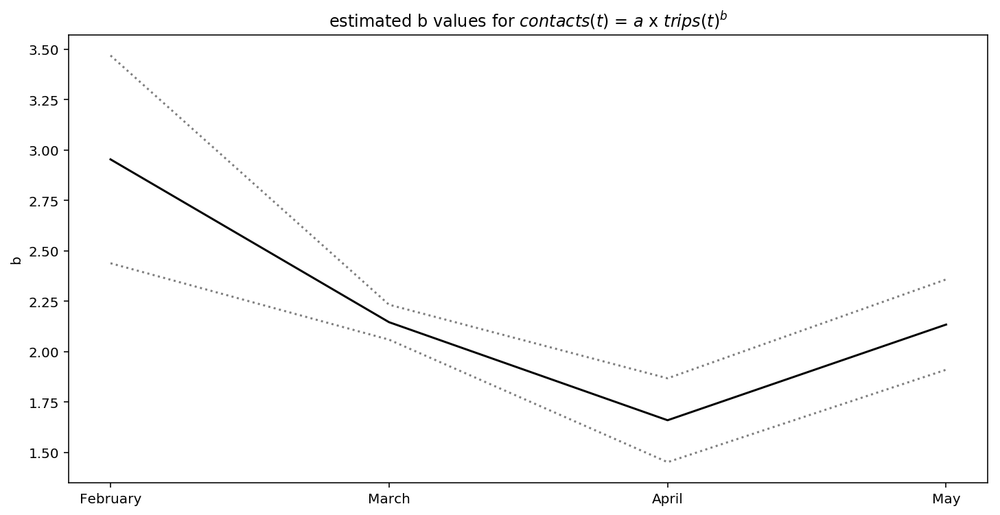

In [130]:
# plot the beta values and confidence intervals over the months

figure,ax = plt.subplots(figsize=(12, 6))
b=all_months_regression_values_df[BETA]
b_95_high = all_months_regression_values_df[BETA_95CI_HIGH]
b_95_low = all_months_regression_values_df[BETA_95CI_LOW]

months=all_months_regression_values_df[MONTH_NAME]
ax.plot(
    months,
    b,
    c='k',
    # linestyle=':',
    #alpha=.5,
    label='b values')

ax.plot(
    months,
    b_95_high,
    c='k',
    linestyle=':',
    alpha=.5,
    label='95% CI')

ax.plot(
    months,
    b_95_low,
    c='k',
    linestyle=':',
    alpha=.5,
    label='95% CI')
ax.set_ylabel("b")
title = 'estimated b values for $contacts(t)$ = $a$ x $trips(t)^b$'
ax.set_title(title)

## Look at  the problem differenetly

Assume b = 2 and attribute the changes to a.

a represents the likelihood of  two people  making a trip  on day t coming into contact.

Hypothesis: while b=2, a decreases.



['Dallas', 'Miami', 'Boston', 'LA', 'Washington', 'New York', 'Seattle']
('intercept', -0.17631005035727243)
('a', 1.0612725058812322)


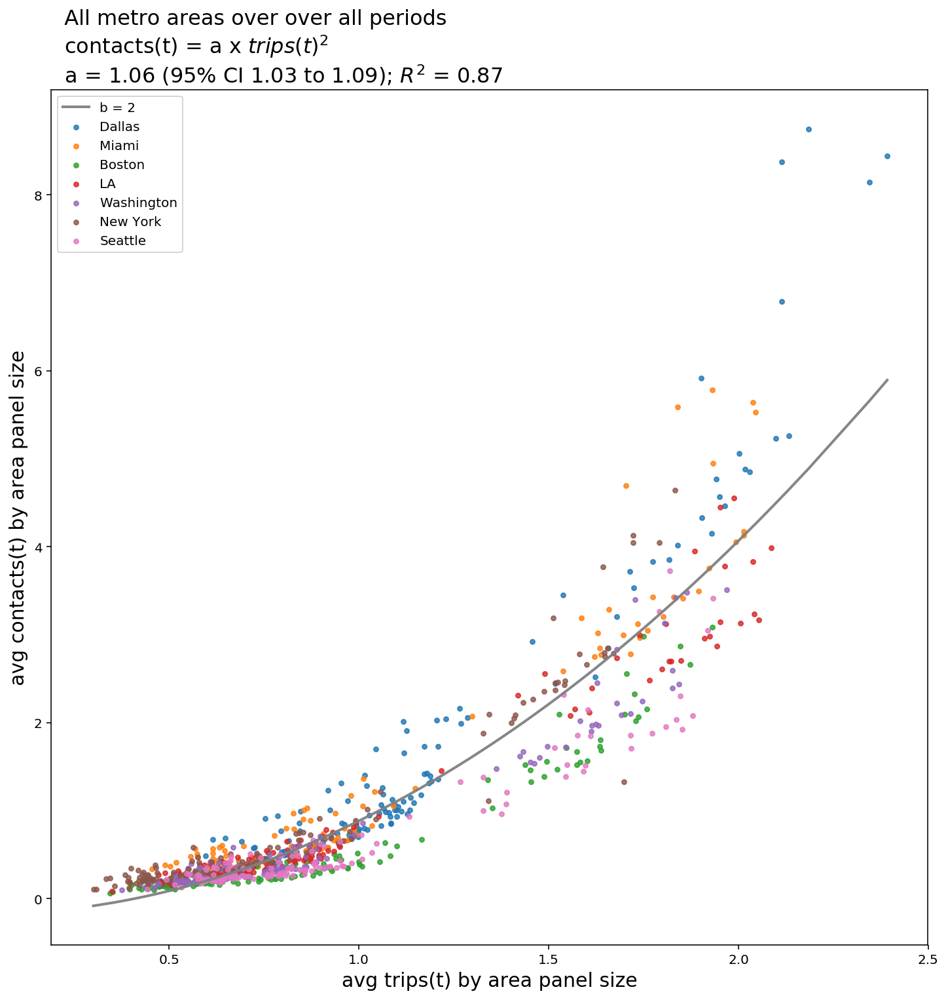

(1.0612725058812322,
 [1.0347569229762443, 1.0877880887862201],
 0.8705631948035681)

In [136]:

marker_size=12
figsize=(12, 12)

def regression_plot_b_is_2(df, over_time_period='over all periods',plot=True,intercept=True):
    metros=df[METRO_AREA].unique().tolist()
    print(metros)
    # contacts = b * trips^2
    x = df[AVG_TRIPS]**2
    y = df[AVG_CONTACTS]
    #  TODO:  try with forcing intercept as 0 ?
    a, intercept, r_value, p_value, std_err = stats.linregress(x.values,y.values)
    r_sq = r_value**2 
    CI_95 = [a - 1.960*std_err, a + 1.960*std_err]
    if plot:    
        figure, ax = plt.subplots(figsize=figsize)
        # plot transformed outputs
        for metro_area in metros:
            m_df = df[df[METRO_AREA]==metro_area]
            x = m_df[AVG_TRIPS]
            y = m_df[AVG_CONTACTS]
            ax.scatter(
                x,
                y,
                s=marker_size,
                label=metro_area,
                alpha=0.8,
            )

        print('intercept',intercept)
        print('a',a)
        y_pred2 = intercept + a*(df[AVG_TRIPS]**2)
        sorted_x2 = df[AVG_TRIPS].sort_values()
        sorted_y_pred2 = y_pred2.sort_values()
        # sq line
        ax.plot(
            sorted_x2,
            sorted_y_pred2,
            c='gray', zorder=1, alpha=.95, linewidth=2,
            label='b = 2'
        )
        ax.legend(loc='upper left')
        title = ('  All metro areas over %s\n' + \
                '  contacts(t) = a x $trips(t)^2$\n' + \
                '  a = %.2f (95%% CI %.2f to %.2f); $R^2$ = %.2f') \
                 % (over_time_period,round(a,3), CI_95[0], CI_95[1],round(r_sq,3))
        ax.set_title(title,
                     loc='left', # left align
                     fontdict={'fontsize':16},
                    )
        ax.set_xlabel('avg trips(t) by area panel size',fontsize=15)
        ax.set_ylabel('avg contacts(t) by area panel size',fontsize=15)

        ax.spines['top'].set_visible(True)
        ax.spines['right'].set_visible(True)
        ax.margins(0.05)
        ax.get_figure().set_facecolor('w')
        plt.show()
    return (a,CI_95,r_sq)


regression_plot_b_is_2(metro_contacts_trips)

In [137]:
# run regression at the metro level for each month to get monthly distribution of a values
# make a df with columns
# month, month name, metro, a, r-sq

month_ints  = [2,3,4,5,6]
metro_areas=metro_contacts_trips[METRO_AREA].unique().tolist()

monthly_metro_records = []
for month_int in month_ints:
    d = datetime.date(2020, month_int, 1)
    month = d.strftime('%B')
    print(month)
    m_df = metro_contacts_trips[metro_contacts_trips[MONTH]==month_int]
    for metro_area in metro_areas:
        mm_df = m_df[m_df[METRO_AREA]==metro_area]
        if not(len(mm_df)):
            continue
        a,CI_95,r_sq = regression_plot_b_is_2(mm_df,plot=False)
        regression_dict = {
            MONTH:month_int,
            MONTH_NAME:month,
            METRO_AREA:metro_area,
            ALPHA: a,
            R_SQ: r_sq,
        }
        monthly_metro_records += [regression_dict]

monthly_metro_results_df = pd.DataFrame(monthly_metro_records)

February
['Dallas']
['Miami']
['Boston']
['LA']
['Washington']
['New York']
['Seattle']
March
['Dallas']
['Miami']
['Boston']
['LA']
['Washington']
['New York']
['Seattle']
April
['Dallas']
['Miami']
['Boston']
['LA']
['Washington']
['New York']
['Seattle']
May
['Dallas']
['Miami']
['Boston']
['LA']
['Washington']
['New York']
['Seattle']
June
['Dallas']
['Miami']
['Boston']
['LA']
['Washington']
['New York']
['Seattle']


In [138]:
monthly_metro_results_df.head(2)  

,a,metro area,month,month name,r-sq
0,2.000216,Dallas,2,February,0.766686
1,1.746295,Miami,2,February,0.546829


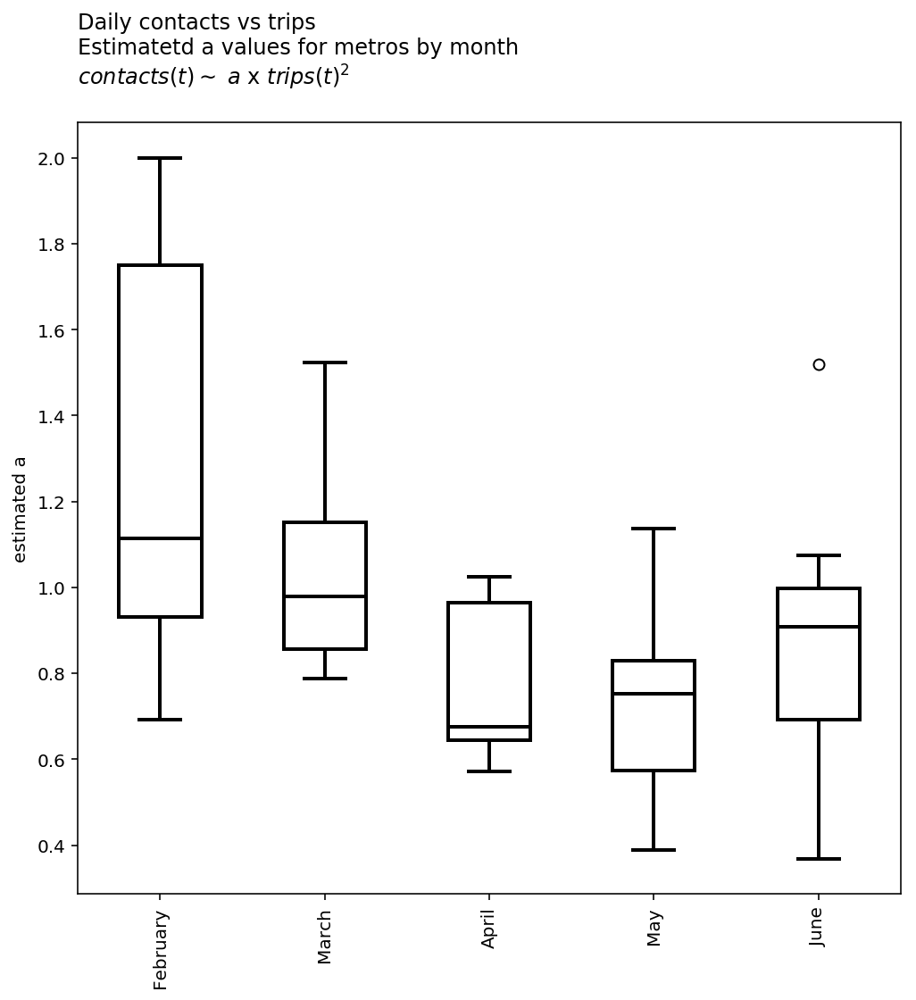

In [139]:
# boxplot
figure, ax = plt.subplots(figsize=(8, 8))

bp = monthly_metro_results_df.boxplot(
    column=ALPHA,
    by=MONTH_NAME,
    positions=[2,0,4,1,3],
    ax=ax,
    return_type='dict',
    rot=90,
    patch_artist=True,
    grid=False,
    )

linewidth=2

[[item.set_color('black') for item in bp[key]['boxes']] for key in bp.keys()]
[[item.set_facecolor('white') for item in bp[key]['boxes']] for key in bp.keys()]
[[item.set_color('black') for item in bp[key]['fliers']] for key in bp.keys()]
[[item.set_color('black') for item in bp[key]['medians']] for key in bp.keys()]
[[item.set_color('black') for item in bp[key]['whiskers']] for key in bp.keys()]
[[item.set_linewidth(linewidth) for item in bp[key]['boxes']] for key in bp.keys()]
[[item.set_linewidth(linewidth) for item in bp[key]['fliers']] for key in bp.keys()]
[[item.set_linewidth(linewidth) for item in bp[key]['medians']] for key in bp.keys()]
[[item.set_linewidth(linewidth) for item in bp[key]['whiskers']] for key in bp.keys()]
[[item.set_linewidth(linewidth) for item in bp[key]['caps']] for key in bp.keys()]

ax.set_ylabel('estimated a')
ax.set_xlabel('')

title = ('Daily contacts vs trips\n' + \
         'Estimatetd a values for metros by month\n' + \
        '$contacts(t) \sim$ $a$ x $trips(t)^2$\n')
plt.title('')
plt.suptitle('')
ax.set_title(title,
             loc='left', # left align
            )
plt.show()

February
['Dallas', 'Miami', 'Boston', 'LA', 'Washington', 'New York', 'Seattle']
('intercept', -2.2823350192921033)
('a', 1.6475305059267464)


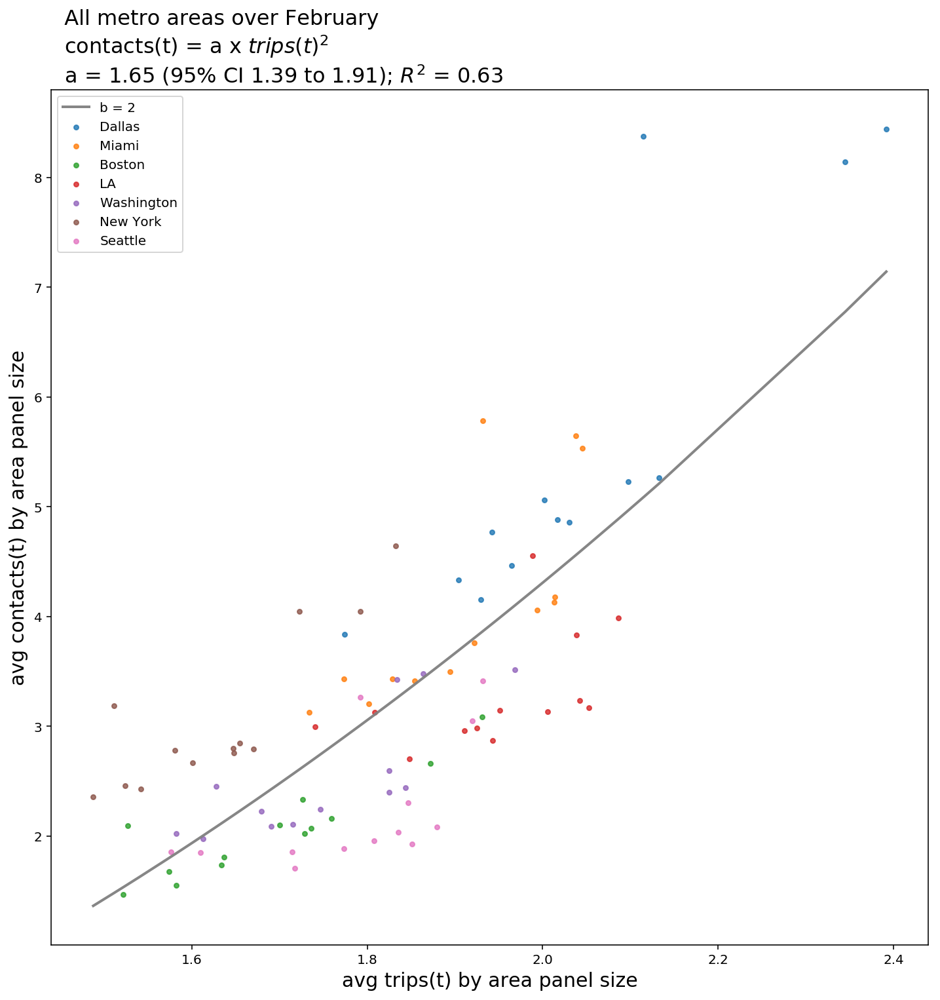

March
['Dallas', 'Miami', 'Boston', 'LA', 'Washington', 'New York', 'Seattle']
('intercept', -0.2520434289183333)
('a', 1.1230565308306937)


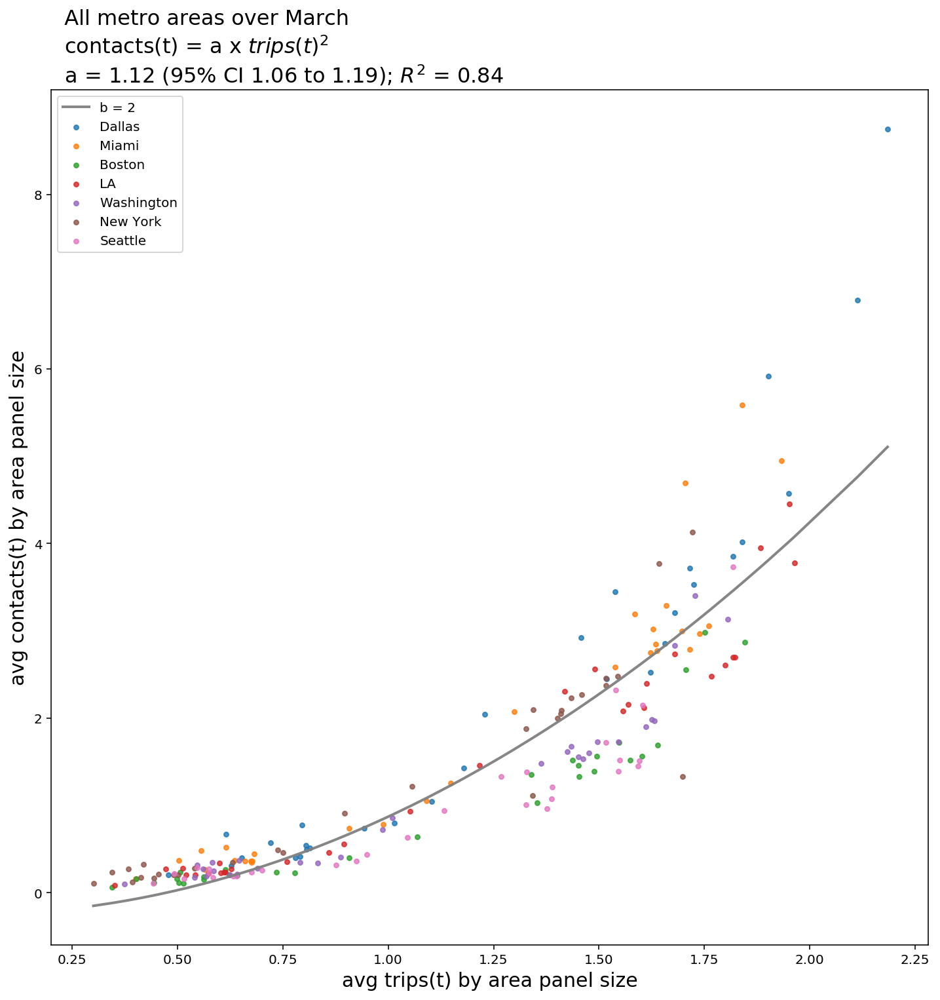

April
['Dallas', 'Miami', 'Boston', 'LA', 'Washington', 'New York', 'Seattle']
('intercept', 0.00800220332335877)
('a', 0.8693600328207906)


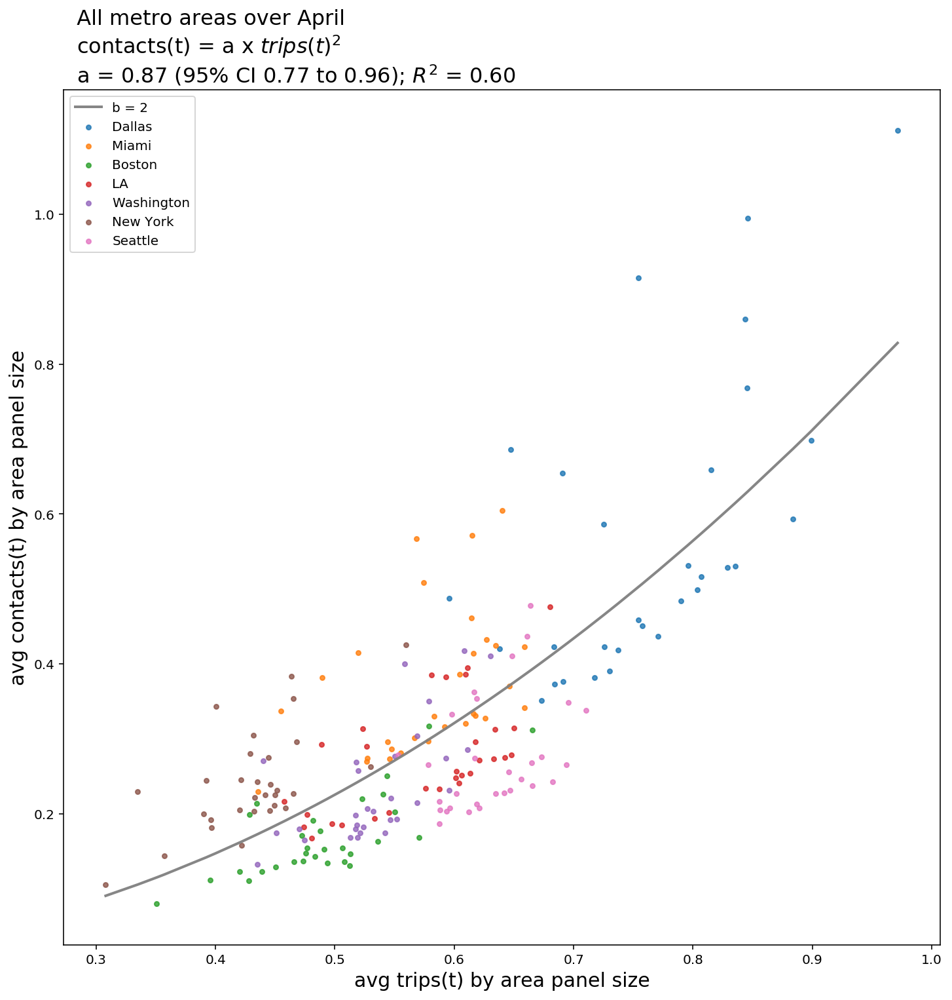

May
['Dallas', 'Miami', 'Boston', 'LA', 'Washington', 'New York', 'Seattle']
('intercept', -0.13299007195796214)
('a', 1.006743087167653)


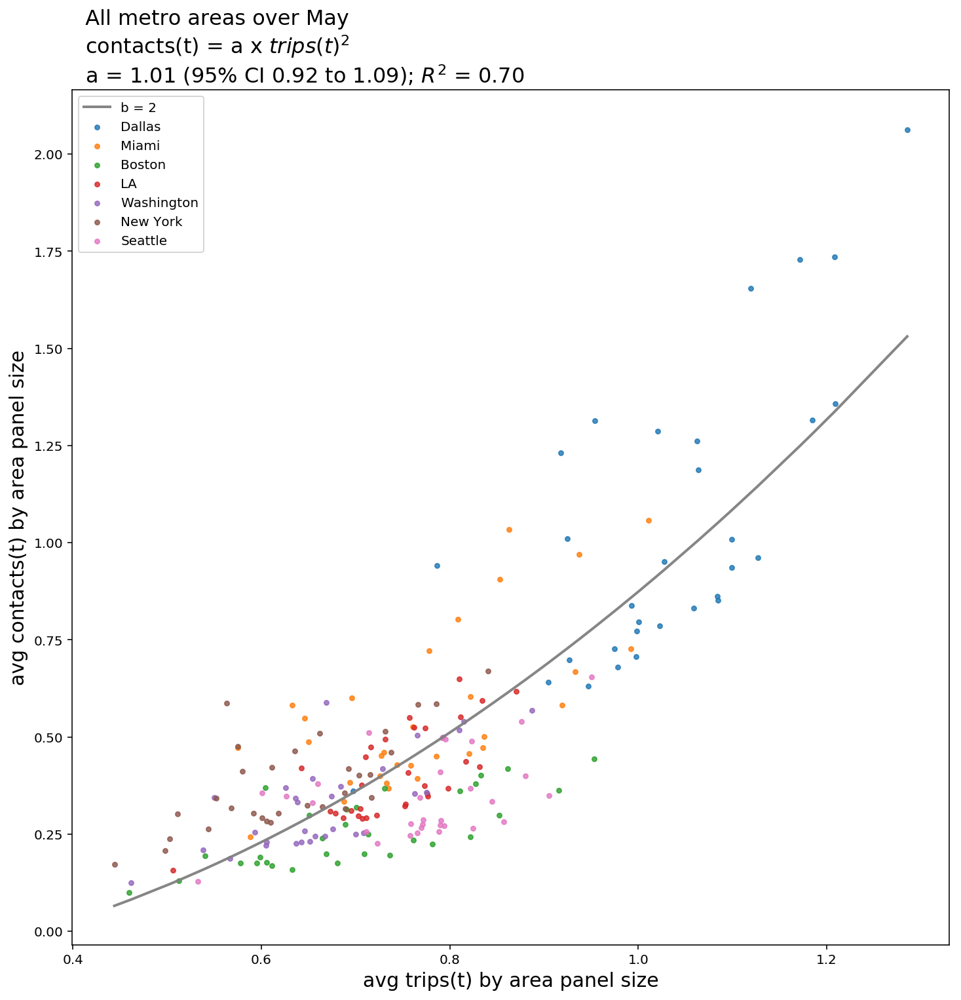

June
['Dallas', 'Miami', 'Boston', 'LA', 'Washington', 'New York', 'Seattle']
('intercept', -0.4359289318050632)
('a', 1.2515067051221178)


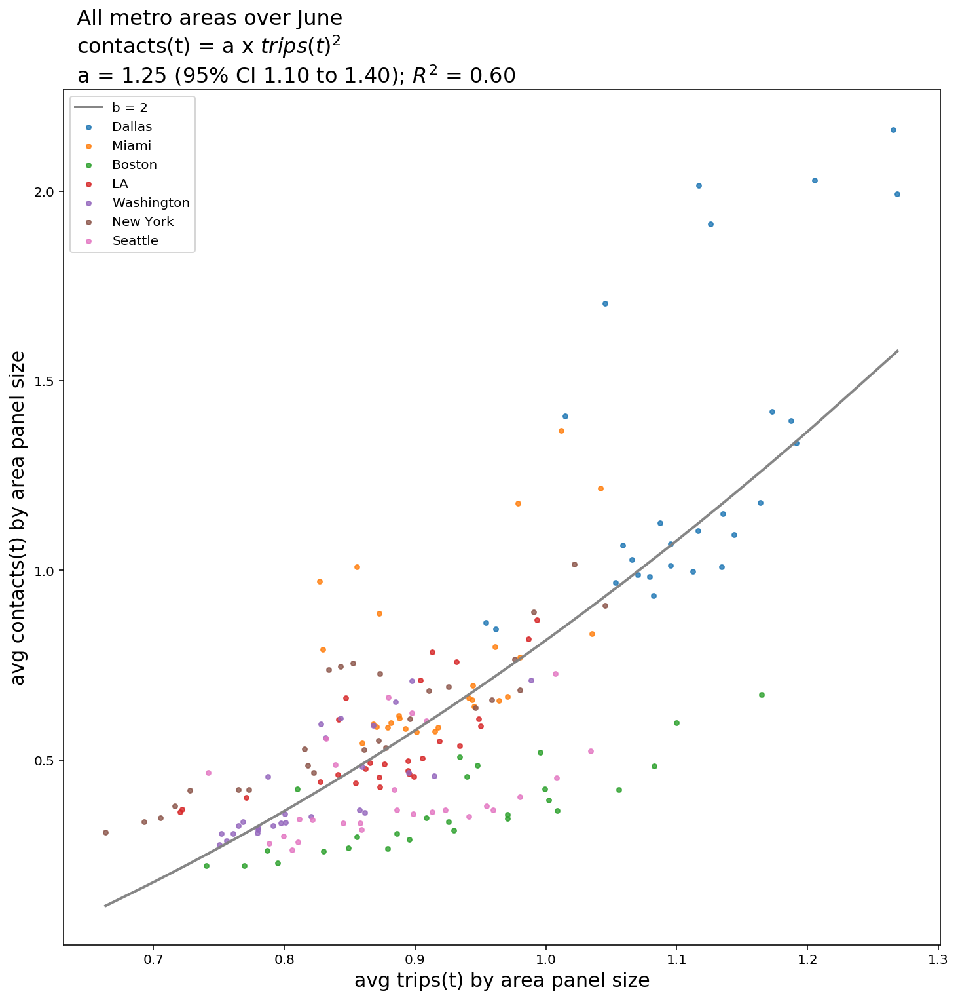

In [140]:
# plots  over months
# and  make a   dataframe with columns:
# month,month name,a,b,a_95CI_low,a_95CI_high,r_sq
ALPHA='a'
ALPHA_95CI_LOW='a 95 CI low'
ALPHA_95CI_HIGH='a 95 CI high'
R_SQ='r-sq'


all_months_regression_a_values = []
month_ints  = [2,3,4,5,6]
for month_int in month_ints:
    d = datetime.date(2020, month_int, 1)
    month = d.strftime('%B')
    print(month)
    month_df = metro_contacts_trips[metro_contacts_trips[MONTH]==month_int]
    a,CI_95,r_sq = regression_plot_b_is_2(month_df,over_time_period=month)
    month_regression_values = {
        MONTH:month_int,
        MONTH_NAME:month,
        ALPHA:a,
        ALPHA_95CI_LOW:CI_95[0],
        ALPHA_95CI_HIGH:CI_95[1],
        R_SQ:r_sq,
    }
    all_months_regression_a_values += [month_regression_values]

In [141]:
all_months_regression_a_values_df = pd.DataFrame(all_months_regression_a_values)
all_months_regression_a_values_df.head()

,a,a 95 CI high,a 95 CI low,month,month name,r-sq
0,1.647531,1.907527,1.387534,2,February,0.634132
1,1.123057,1.189813,1.056300,3,March,0.839413
2,0.869360,0.964777,0.773943,4,April,0.605242
3,1.006743,1.093720,0.919766,5,May,0.705352
4,1.251507,1.398227,1.104786,6,June,0.599151


February
['Dallas', 'Miami', 'LA', 'Washington', 'New York', 'Seattle']
('intercept', -2.0972815188797793)
('a', 1.6117698197538124)


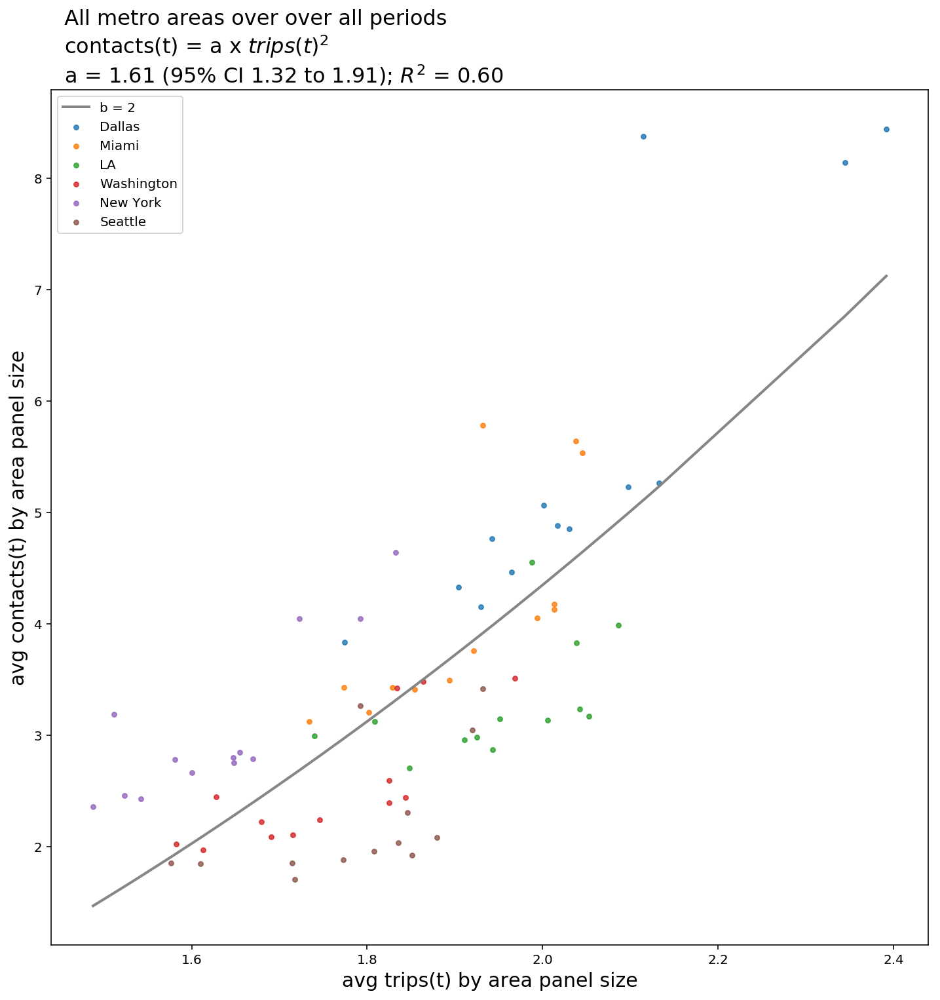

March
['Dallas', 'Miami', 'LA', 'Washington', 'New York', 'Seattle']
('intercept', -0.25947334366980646)
('a', 1.1632839643039903)


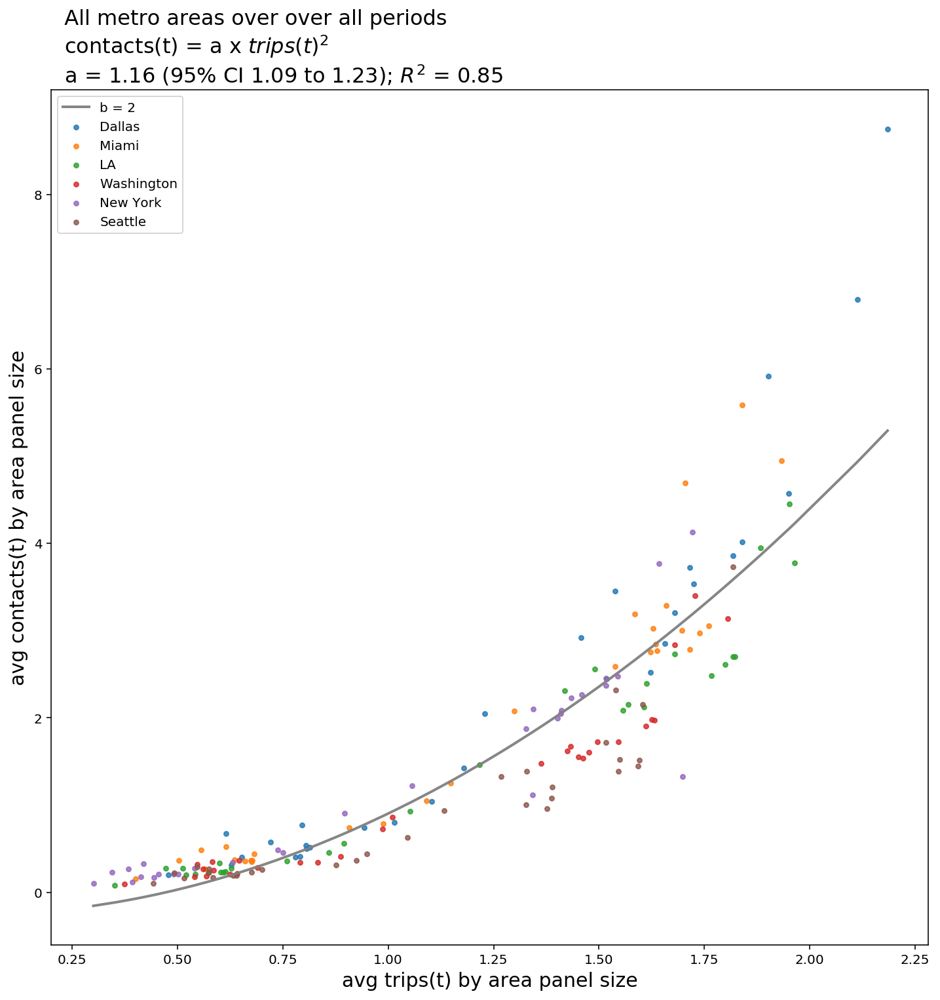

April
['Dallas', 'Miami', 'LA', 'Washington', 'New York', 'Seattle']
('intercept', 0.031290778958039445)
('a', 0.8280477313336482)


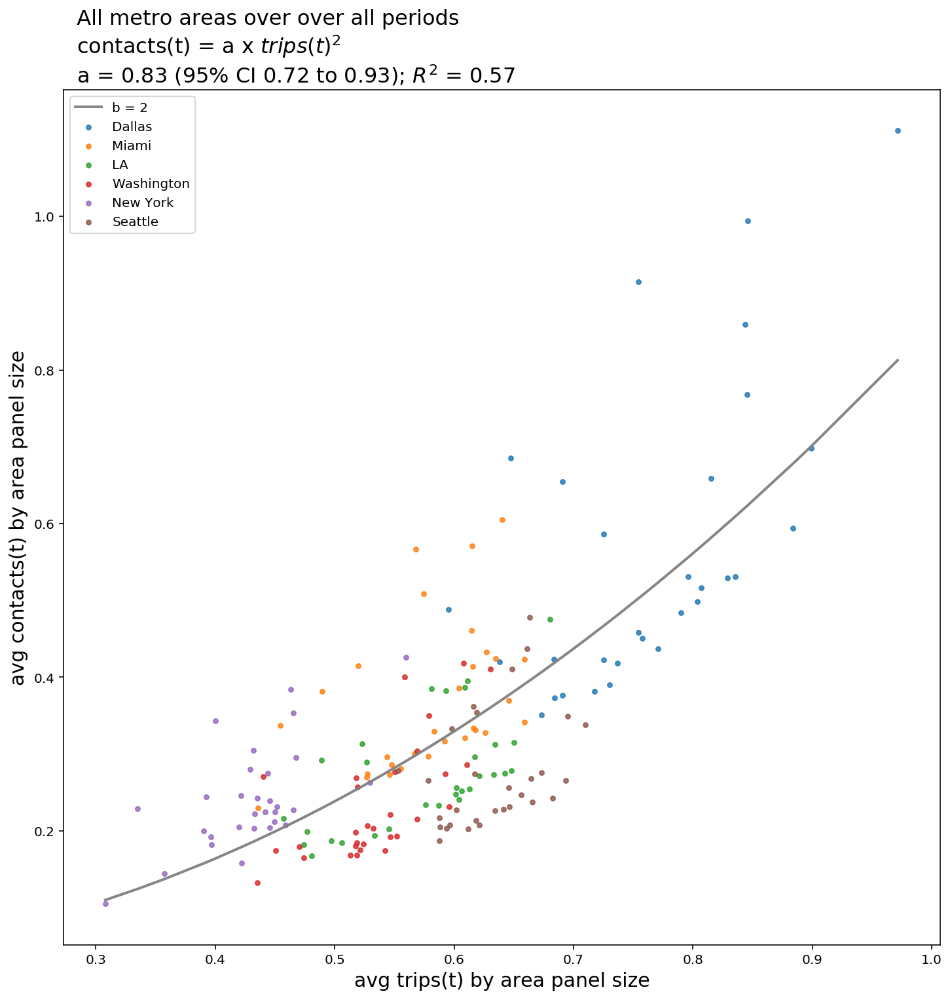

May
['Dallas', 'Miami', 'LA', 'Washington', 'New York', 'Seattle']
('intercept', -0.11799852658844823)
('a', 1.0145270706700773)


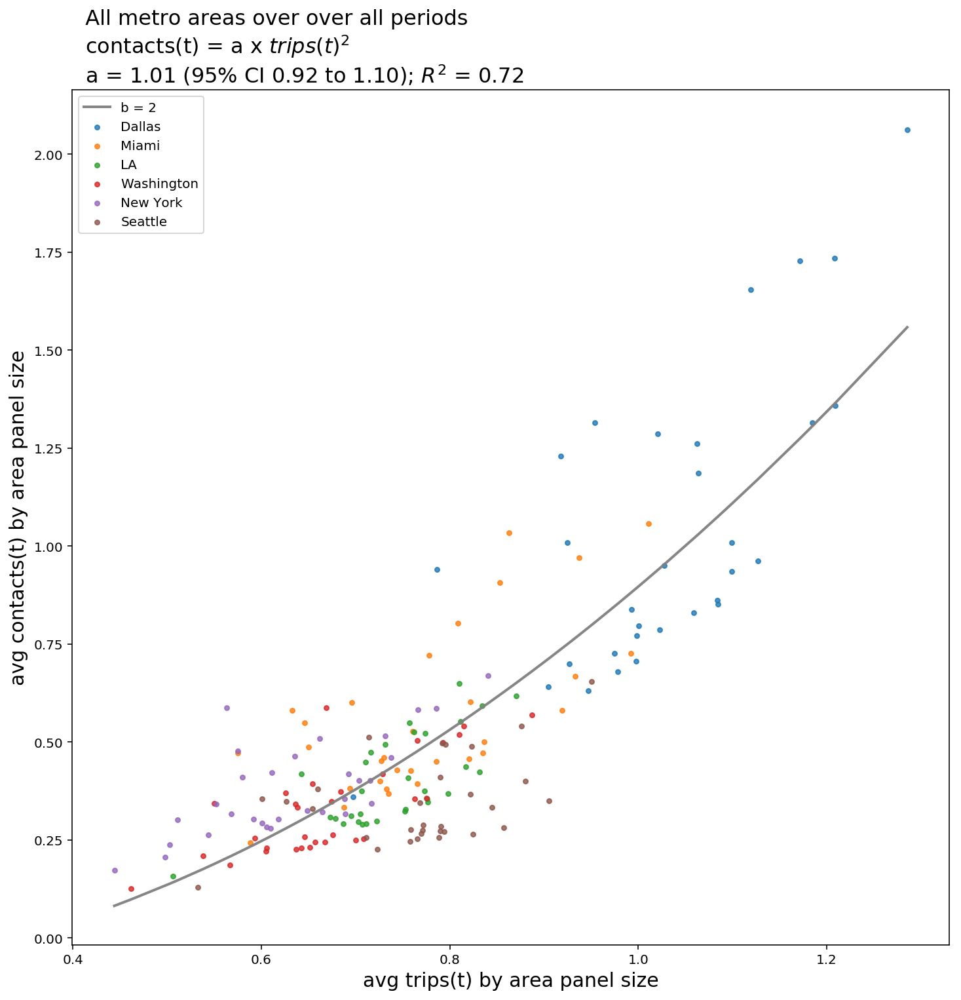

In [142]:
# what about without boston?

no_boston_all_months_regression_a_values = []
month_ints  = [2,3,4,5]
for month_int in month_ints:
    d = datetime.date(2020, month_int, 1)
    month = d.strftime('%B')
    print(month)
    month_df = no_boston[no_boston[MONTH]==month_int]
    a,CI_95,r_sq = regression_plot_b_is_2(month_df)
    month_regression_values = {
        MONTH:month_int,
        MONTH_NAME:month,
        ALPHA:a,
        ALPHA_95CI_LOW:CI_95[0],
        ALPHA_95CI_HIGH:CI_95[1],
        R_SQ:r_sq,
    }
    no_boston_all_months_regression_a_values += [month_regression_values]

Text(0.5,1,'estimated a values for $contacts(t)$ = $a$ x $trips(t)^2$')

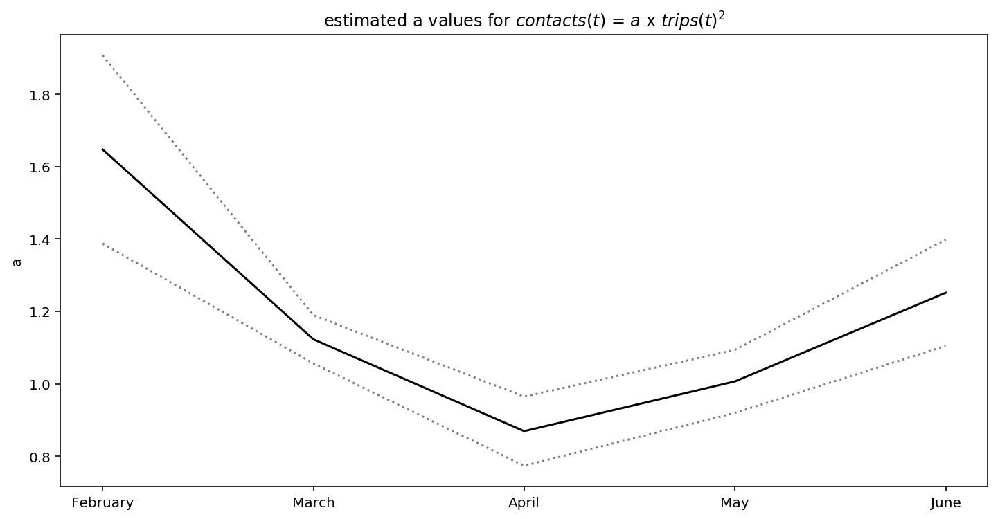

In [143]:
# Plot the alpha  values over the months

# plot the beta values and confidence intervals over the months

figure,ax = plt.subplots(figsize=(12, 6))
a=all_months_regression_a_values_df[ALPHA]
a_95_high = all_months_regression_a_values_df[ALPHA_95CI_HIGH]
a_95_low = all_months_regression_a_values_df[ALPHA_95CI_LOW]

months=all_months_regression_a_values_df[MONTH_NAME]
ax.plot(
    months,
    a,
    c='k',
    # linestyle=':',
    #alpha=.5,
    label='a values')

ax.plot(
    months,
    a_95_high,
    c='k',
    linestyle=':',
    alpha=.5,
    label='95% CI')

ax.plot(
    months,
    a_95_low,
    c='k',
    linestyle=':',
    alpha=.5)
ax.set_ylabel("a")
title = 'estimated a values for $contacts(t)$ = $a$ x $trips(t)^2$'
ax.set_title(title)


## Population density

What about  population density?

suppose 

$$c_{i}(t) \propto pDensity_{i}^{alpha} \times trips_{i}(t)^2$$

So we  estimate

$$c_{i}(t) = constant \times pDensity_{i}^{alpha} \times trips_{i}(t)^{beta}$$

With a log-linear regression


$$log(c_{i}(t)) = constant + alpha \times log(pDensity_{i}) + beta \times log(trips_{i}(t))$$

First get population densities.

Make mapping (series):
```
county FIPS, population density
```

then for each  metro  make table:
```
county FIPs, population density, day, contacts, trips
```
save to file for reload

tranform to
```
county FIPs, population density, day, contacts, trips, mean contactst, mean trips
```
use in OLS

In [144]:
GEOID = 'GEOID'
NAME='name'
FIPS = 'county FIPS'
POPULATION = 'population'
POP_DENSITY = 'population density'
LOG_POP_DENSITY  = 'log population density'

In [145]:


# Note  must use  ACS 5-yr estimates vs 1-yr otherwise have missing counties
# downloaded from https://data.census.gov/cedsci/table?q=United%20States&g=0100000US.050000&hidePreview=true&tid=ACSDP5Y2018.DP05&y=2018&t=Populations%20and%20People&d=ACS%205-Year%20Estimates%20Data%20Profiles
acs_county_pop_datapath = datapath + 'ACS2018_5YR_population_estimates/ACSDP5Y2018.DP05_data_with_overlays_2020-06-06T120415.csv'
acs_county_pop_df = pd.read_csv(acs_county_pop_datapath,
                           usecols=[0,1,7],
                            names=[GEOID,NAME,POPULATION],
                            header=0,
                           ).iloc[1:]
acs_county_pop_df[FIPS] = acs_county_pop_df[GEOID].apply(lambda x: str(x)[-5:])
acs_county_pop_df.head(3)

/usr/local/lib/python2.7/dist-packages/IPython/core/interactiveshell.py:2714: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,GEOID,name,population,county FIPS
1,0500000US01001,"Autauga County, Alabama",55200,01001
2,0500000US01003,"Baldwin County, Alabama",208107,01003
3,0500000US01005,"Barbour County, Alabama",25782,01005


In [146]:
fips_to_name = acs_county_pop_df.set_index(FIPS)[NAME]
fips_to_name.head()

county FIPS
01001    Autauga County, Alabama
01003    Baldwin County, Alabama
01005    Barbour County, Alabama
01007       Bibb County, Alabama
01009     Blount County, Alabama
Name: name, dtype: object

In [147]:
fips_to_name.to_dict()['25017']

'Middlesex County, Massachusetts'

In [148]:
import geopandas as gpd
shapefile_datapath = datapath + 'tl_2019_us_county'
county_shapefile = gpd.read_file(shapefile_datapath).rename(columns={GEOID:FIPS})
county_shapefile.head(1)

,STATEFP,COUNTYFP,COUNTYNS,county FIPS,NAME,NAMELSAD,LSAD,CLASSFP,MTFCC,CSAFP,CBSAFP,METDIVFP,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
0,31,039,00835841,31039,Cuming,Cuming County,06,H1,G4020,None,None,None,A,1477652222,10690952,+41.9158651,-096.7885168,"POLYGON ((-97.01952 42.00410, -97.01952 42.004..."


In [149]:
fips_to_pop = acs_county_pop_df.set_index(FIPS)[POPULATION].astype(float)
fips_to_land = county_shapefile.set_index(FIPS)['ALAND'].astype(float)
fips_to_pop_density = fips_to_pop/fips_to_land
# fips_to_pop_density.head()

In [150]:
def get_panel_user_county_fips(area):
    """Returns series mapping county FIPS to user ID"""
    panel_data_filepath = datapath + str(area) + '/' + 'homes.final.txt'
    panel_df = pd.read_csv(panel_data_filepath)
    panel_df[FIPS] = panel_df[GEOID].apply(lambda x: str(x)[-11:-6])
    return panel_df.set_index('user')[FIPS]

In [151]:
def get_panel_county_fips(area):
    panel_user_county_fips = get_panel_user_county_fips(area)
    return panel_user_county_fips.unique()

In [152]:
metro_name = 'Boston'
area_id = metro_area_to_id[metro_name]
panel_county_fips = get_panel_county_fips(area_id)
panel_county_fips

array(['25017', '25009', '25023', '25025', '33015', '25021', '33017'],
      dtype=object)

In [153]:
metro_fips_to_pop_density = fips_to_pop_density.loc[panel_county_fips]
metro_fips_to_pop_density.head(3)

county FIPS
25017    0.000753
25009    0.000612
25023    0.000300
dtype: float64

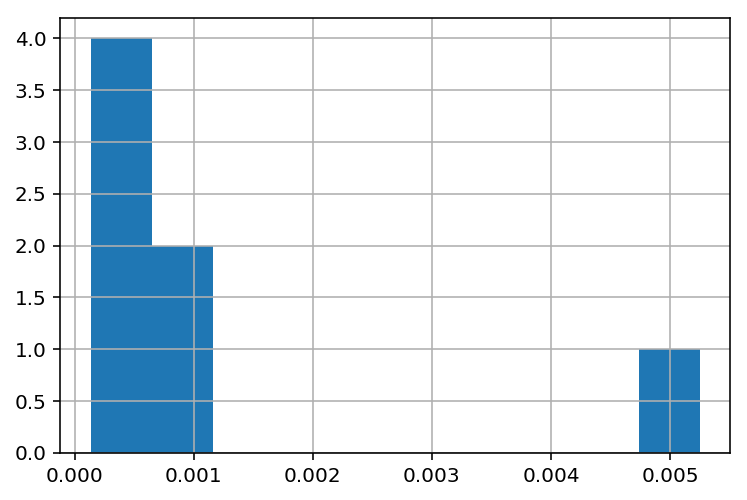

In [154]:
metro_fips_to_pop_density.hist()

In [158]:
def get_transformed_county_contacts_trips_data(area_id, dates=dates):
    """
    Returns dataframe for area with columns:
    county FIPs, day, contacts, avg contacts, trips, avg trips
    
    days are restricted to dates
    data is restricted to area user panel 
    """
    print('handling area: %s' % area_id)
    contacts_path = datapath + str(area_id) + '/' + 'p4_with_county_data/'
    stays_path = datapath + str(area_id) + '/' + 'p3_output_stays_by_date_clean_personal_area/'
    
    county_df = pd.DataFrame({
        FIPS:[],
        DAY : [],
        CONTACTS: [],
        TRIPS: [],
    })
    
    # Get panel users and panel size for each county
    user_fips = get_panel_user_county_fips(area_id)
    panel_users = user_fips.index
    fips_panel_size = user_fips.value_counts()
    

    for date in dates:
        print('handling data for %s' % date)
        try:
            contacts_filepath = contacts_path + date + '.csv.gz'
            contacts_df = pd.read_csv(contacts_filepath,dtype='string')[['u1','u2','FIP','pc1', 'pc2']]
            # read stays data
            stays_filepath = stays_path + date + '.csv.gz'
            stays_df = pd.read_csv(stays_filepath)[['perc_personal_area', 'user_id']]
        except Exception as e:
            print('skipping date %s' % date)
            print(e)
            continue
            
        # TRIPS
        # restrict stays data to user panel data where not personal area
        stays_df = stays_df[stays_df['perc_personal_area'] < 1]
        stays_df = stays_df[stays_df['user_id'].isin(panel_users)]
        # attach user home county  FIPS
        stays_df[FIPS] = stays_df['user_id'].map(user_fips)
        # aggregate trips by county FIPS  and make day DF
        county_day_df = stays_df.groupby(FIPS)['user_id'].count().reset_index().rename(columns={'user_id':TRIPS})

        # CONTACTS
        # restrict contacts data to user panel data where not personal area
        contacts_df = contacts_df[(contacts_df['pc1'].astype(float) < 1) & (contacts_df['pc2'].astype(float) < 1)]
        contacts_df = contacts_df[contacts_df['u1'].isin(panel_users) & contacts_df['u2'].isin(panel_users)]
        # The contacts metric counts the number of times a user with residence in county i comes
        # into contact with another user within county i. 
        # limit DF to where FIP is same as home FIP for u1 --> name  as fips1
        # and then county by fips1
        contacts_df['fips1']= contacts_df['u1'].map(user_fips)
        # previously we restricted metric to contacts within county of residence
        # contacts_df = contacts_df[contacts_df['FIP']==contacts_df['fips1']]
        fips_to_contacts = contacts_df.rename(columns={'fips1':FIPS}).groupby(FIPS)['u1'].count()
        county_day_df[CONTACTS] = county_day_df[FIPS].map(fips_to_contacts)
        
        county_day_df[DAY] = date
        
        county_df = county_df.append(county_day_df,ignore_index=True)
    
    county_df[AVG_CONTACTS] = county_df[CONTACTS].astype(float)/county_df[FIPS].map(fips_panel_size).astype(float)
    county_df[AVG_TRIPS] = county_df[TRIPS].astype(float)/county_df[FIPS].map(fips_panel_size).astype(float)
    return county_df


In [159]:
metro_area_to_county_data = {}

In [ ]:

for metro_area in use_metros:
    area_id = metro_area_to_id[metro_area]
    print('\ngetting data for metro area %s (%s)' % (metro_area, area_id))
    df = get_transformed_county_contacts_trips_data(area_id)
    if len(df) < 10:
        print('insufficient data for %s'% metro_area)
        continue
    metro_area_to_county_data[metro_area] = df


getting data for metro area Boston (14460)
handling area: 14460
handling data for 2020-02-17


In [ ]:
df = metro_area_to_county_data['Boston']
df.head()

In [ ]:
metro_area_to_county_data.keys()

In [169]:
def get_county_contacts_trips_filepath(area):
    return datapath + str(area) + '/county_contacts_trips.csv'

Save  the data because loading and  computing  it the first time takes a while

In [153]:
for metro_area, df in metro_area_to_county_data.items():
    area_id = metro_area_to_id[metro_area]
    fpath = get_county_contacts_trips_filepath(area_id)
    print('saving contacts and trips data for %s (%s) to %s' % (metro_area, area_id, fpath))
    df.to_csv(fpath, index=False)
    print('saved')

saving contacts and trips data for Dallas (19100) to /data/covid/19100/county_contacts_trips.csv
saved
saving contacts and trips data for Miami (33100) to /data/covid/33100/county_contacts_trips.csv
saved
saving contacts and trips data for Boston (14460) to /data/covid/14460/county_contacts_trips.csv
saved
saving contacts and trips data for LA (31080) to /data/covid/31080/county_contacts_trips.csv
saved
saving contacts and trips data for Washington (47900) to /data/covid/47900/county_contacts_trips.csv
saved
saving contacts and trips data for New York (35620) to /data/covid/35620/county_contacts_trips.csv
saved
saving contacts and trips data for Seattle (42660) to /data/covid/42660/county_contacts_trips.csv
saved


Script re-entry point

In [228]:
metro_area_to_county_data = {}
for metro_area in use_metros: # use_metros
    area_id = metro_area_to_id[metro_area]
    fpath = get_county_contacts_trips_filepath(area_id)
    df = pd.read_csv(fpath)
    df[FIPS] = df[FIPS].astype(str)
    df[LOG_AVG_CONTACTS] = np.log(df[AVG_CONTACTS])
    df[LOG_AVG_TRIPS] = np.log(df[AVG_TRIPS])
    metro_area_to_county_data[metro_area] = df
    print('loaded previously saved data for %s (%s)' % (metro_area, area_id))

loaded previously saved data for Boston (14460)
loaded previously saved data for Dallas (19100)
loaded previously saved data for Seattle (42660)
loaded previously saved data for Washington (47900)
loaded previously saved data for New York (35620)
loaded previously saved data for Miami (33100)
loaded previously saved data for LA (31080)


In [229]:
metro_area_to_county_data.keys()

['Dallas', 'Miami', 'Boston', 'LA', 'Washington', 'New York', 'Seattle']

In [176]:
# There is a problem with data for March 31 - remove it.
bad_date = datetime.date(2020, 3, 31).strftime(date_fmt)
print('removing from data: %s' % bad_date)
for metro_area, df in metro_area_to_county_data.items():
    metro_area_to_county_data[metro_area] = df[df[DAY]!=bad_date]

removing from data: 2020-03-31


In [177]:
# make a big table with it all

metro_county_contacts_trips = None

for metro_area,df in metro_area_to_county_data.items():
    df[METRO_AREA]=metro_area
    if metro_county_contacts_trips is None:
        metro_county_contacts_trips = df
    else:
        metro_county_contacts_trips=metro_county_contacts_trips.append(df)
        
metro_county_contacts_trips[POP_DENSITY]=metro_county_contacts_trips[FIPS].map(fips_to_pop_density)
metro_county_contacts_trips[NAME]=metro_county_contacts_trips[FIPS].map(fips_to_name)

In [178]:
print(metro_county_contacts_trips.shape)

metro_county_contacts_trips.head()

(9956, 11)


,contacts,county FIPS,day,trips,avg contacts,avg trips,log avg contacts,log avg trips,metro area,population density,name
0,300169.0,48085,2020-02-17,108837.0,5.052244,1.831872,1.619833,0.605338,Dallas,0.000433,"Collin County, Texas"
1,243605.0,48113,2020-02-17,144136.0,3.250797,1.923429,1.178900,0.654110,Dallas,0.001145,"Dallas County, Texas"
2,272963.0,48121,2020-02-17,97936.0,5.242534,1.880961,1.656805,0.631783,Dallas,0.000354,"Denton County, Texas"
3,46996.0,48139,2020-02-17,24333.0,3.983725,2.062643,1.382217,0.723988,Dallas,0.000070,"Ellis County, Texas"
4,8033.0,48221,2020-02-17,6673.0,2.275637,1.890368,0.822260,0.636772,Dallas,0.000052,"Hood County, Texas"


In [179]:
# compute regression plot them all together

def run_regression(df):
    # avg contacts = a x (avg trips)^b
    # but a is negative
    # log(avg contacts) = log(a) + b x log(avg trips)
    log_avg_trips=np.log(df[AVG_TRIPS])
    x = df[LOG_AVG_TRIPS]
    y = df[LOG_AVG_CONTACTS]

    b, log_a, r_value, p_value, std_err = stats.linregress(x.values,y.values)
    # print(b, log_a_inverted, r_value, p_value, std_err)
    a = math.exp(log_a)
    r_sq = r_value**2 
    CI_95 = [b - 1.960*std_err, b + 1.960*std_err]
    return a,b,r_sq, CI_95


In [180]:
# run regression for all data 
a,b,r_sq, CI_95 = run_regression(metro_county_contacts_trips)
a,b,r_sq, CI_95

(0.7241036130141277,
 1.9110722641046585,
 0.7965305840594405,
 [1.8920972239358003, 1.9300473042735167])

In [181]:
# run regression at the metro level

metro_records = []
for metro_area,df in metro_area_to_county_data.items():
    area_id = metro_area_to_id[metro_area]
    print('metro area:', metro_area, area_id)
    user_fips = get_panel_user_county_fips(area_id)
    fips_panel_size = len(user_fips)
    metro_fips = user_fips.unique()
    a,b,r_sq, CI_95 = run_regression(df)
    regression_dict = {
        METRO_AREA:metro_area,
        PANEL_SIZE: fips_panel_size,
        ALPHA: a,
        BETA: b,
    }
    metro_records += [regression_dict]

metro_regression_results_df = pd.DataFrame(metro_records)
metro_regression_results_df.head()  

('metro area:', 'Dallas', 19100)
('metro area:', 'Miami', 33100)
('metro area:', 'Boston', 14460)
('metro area:', 'LA', 31080)
('metro area:', 'Washington', 47900)
('metro area:', 'New York', 35620)
('metro area:', 'Seattle', 42660)


,a,b,metro area,panel size
0,0.898042,2.176166,Dallas,345683
1,0.992594,2.043975,Miami,214897
2,0.528311,2.006197,Boston,110169
3,0.814854,2.111690,LA,321548
4,0.548216,1.787425,Washington,162214


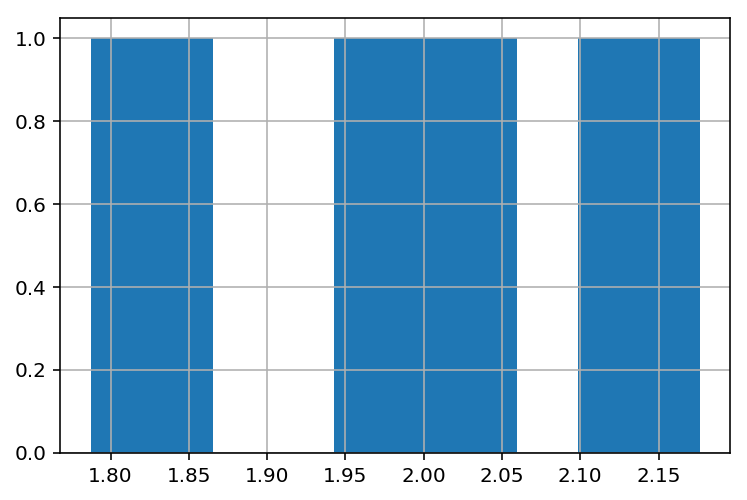

In [182]:
metro_regression_results_df[BETA].hist()

run regression for each county

In [183]:
fips_records = []
for metro_area,df in metro_area_to_county_data.items():
    area_id = metro_area_to_id[metro_area]
    print('metro area:', metro_area, area_id)
    user_fips = get_panel_user_county_fips(area_id)
    fips_panel_size_dict = user_fips.value_counts().to_dict()
    metro_fips = user_fips.unique()
    for f in metro_fips:
        f_df = df[df[FIPS]==f]
        a,b,r_sq, CI_95 = run_regression(f_df)
        county_regression_dict = {
            METRO_AREA:metro_area,
            FIPS:f,
            PANEL_SIZE: fips_panel_size_dict[f],
            ALPHA: a,
            BETA: b,
        }
        fips_records += [county_regression_dict]

metro_county_regression_results_df = pd.DataFrame(fips_records)
metro_county_regression_results_df.head()

('metro area:', 'Dallas', 19100)
('metro area:', 'Miami', 33100)
('metro area:', 'Boston', 14460)
('metro area:', 'LA', 31080)
('metro area:', 'Washington', 47900)
('metro area:', 'New York', 35620)
('metro area:', 'Seattle', 42660)


,a,b,county FIPS,metro area,panel size
0,1.282813,2.167903,48121,Dallas,52074
1,0.699157,2.302165,48113,Dallas,74926
2,0.969979,2.287157,48439,Dallas,92311
3,0.773894,2.476110,48251,Dallas,11552
4,1.401800,2.255426,48085,Dallas,59425


Text(0,0.5,'counties')

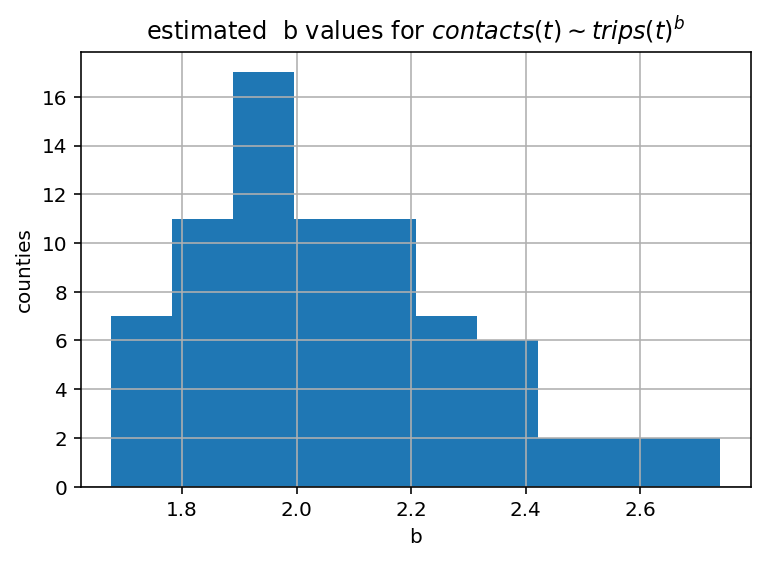

In [184]:
h = metro_county_regression_results_df[BETA].hist(
)
h.set_title('estimated  b values for $contacts(t) \sim trips(t)^b$')
h.set_xlabel('b')
h.set_ylabel('counties')

Text(0,0.5,'counties')

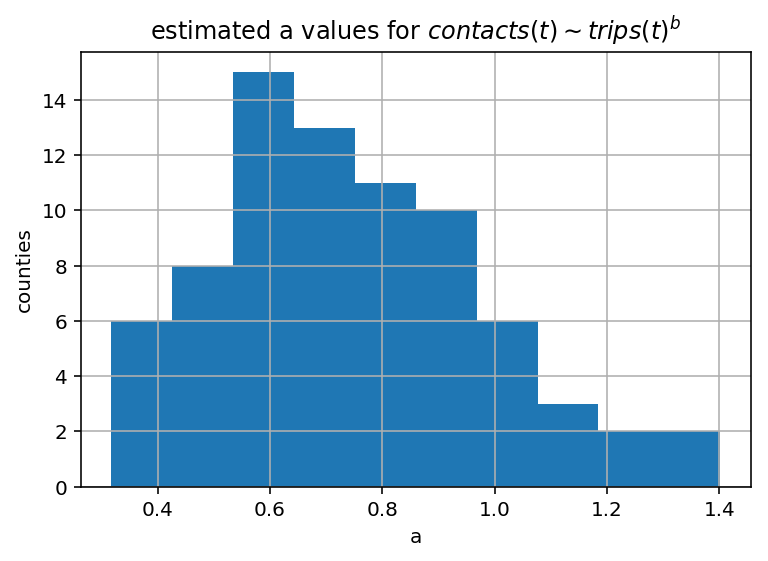

In [186]:
h = metro_county_regression_results_df[ALPHA].hist()
h.set_title('estimated a values for $contacts(t) \sim trips(t)^b$')
h.set_xlabel('a')
h.set_ylabel('counties')

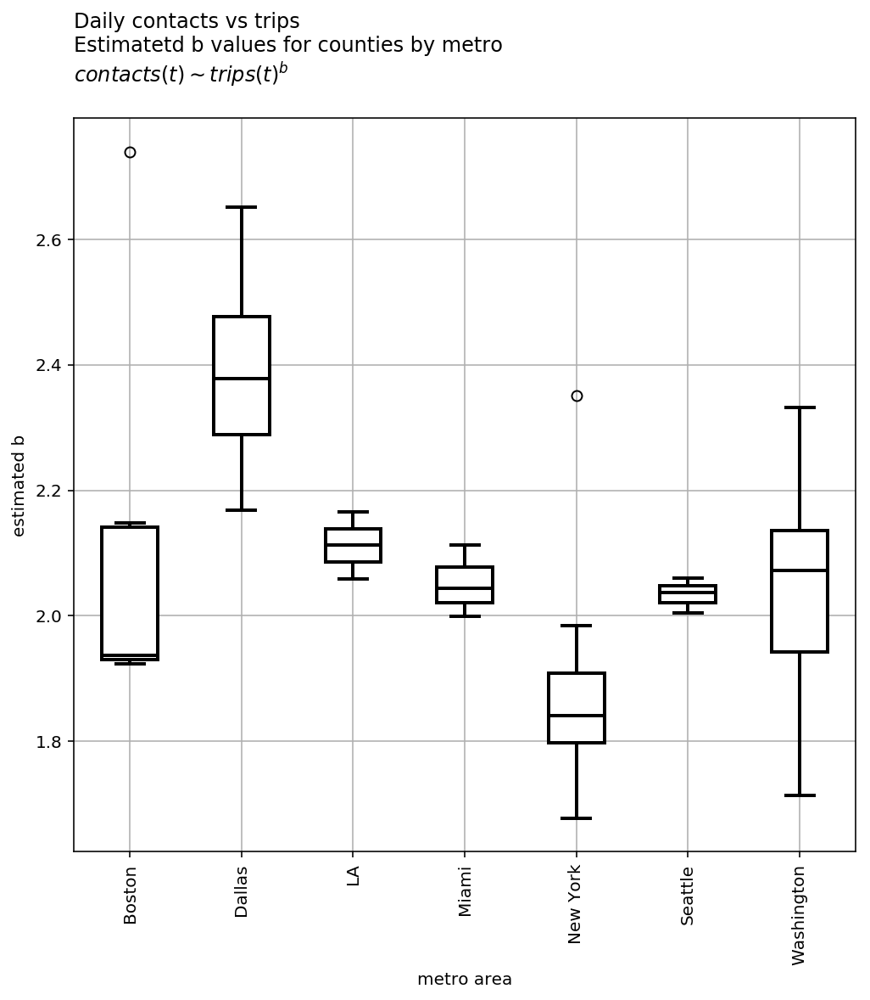

In [187]:
# boxplot
figure, ax = plt.subplots(figsize=(8, 8))

bp = metro_county_regression_results_df.boxplot(column=BETA,
    by=METRO_AREA,
    ax=ax,
    #grid=False,
    return_type='dict',
    rot=90,
    patch_artist=True,
    )

linewidth=2

[[item.set_color('black') for item in bp[key]['boxes']] for key in bp.keys()]
[[item.set_facecolor('white') for item in bp[key]['boxes']] for key in bp.keys()]
[[item.set_color('black') for item in bp[key]['fliers']] for key in bp.keys()]
[[item.set_color('black') for item in bp[key]['medians']] for key in bp.keys()]
[[item.set_color('black') for item in bp[key]['whiskers']] for key in bp.keys()]
[[item.set_linewidth(linewidth) for item in bp[key]['boxes']] for key in bp.keys()]
[[item.set_linewidth(linewidth) for item in bp[key]['fliers']] for key in bp.keys()]
[[item.set_linewidth(linewidth) for item in bp[key]['medians']] for key in bp.keys()]
[[item.set_linewidth(linewidth) for item in bp[key]['whiskers']] for key in bp.keys()]
[[item.set_linewidth(linewidth) for item in bp[key]['caps']] for key in bp.keys()]

# plt.xticks(rotation=90)
ax.set_ylabel('estimated b')

title = ('Daily contacts vs trips\n' + \
         'Estimatetd b values for counties by metro\n' + \
        '$contacts(t) \sim trips(t)^b$\n')
plt.title('')
plt.suptitle('')
ax.set_title(title,
             loc='left', # left align
             # fontdict={'fontsize':16},
            )
plt.show()

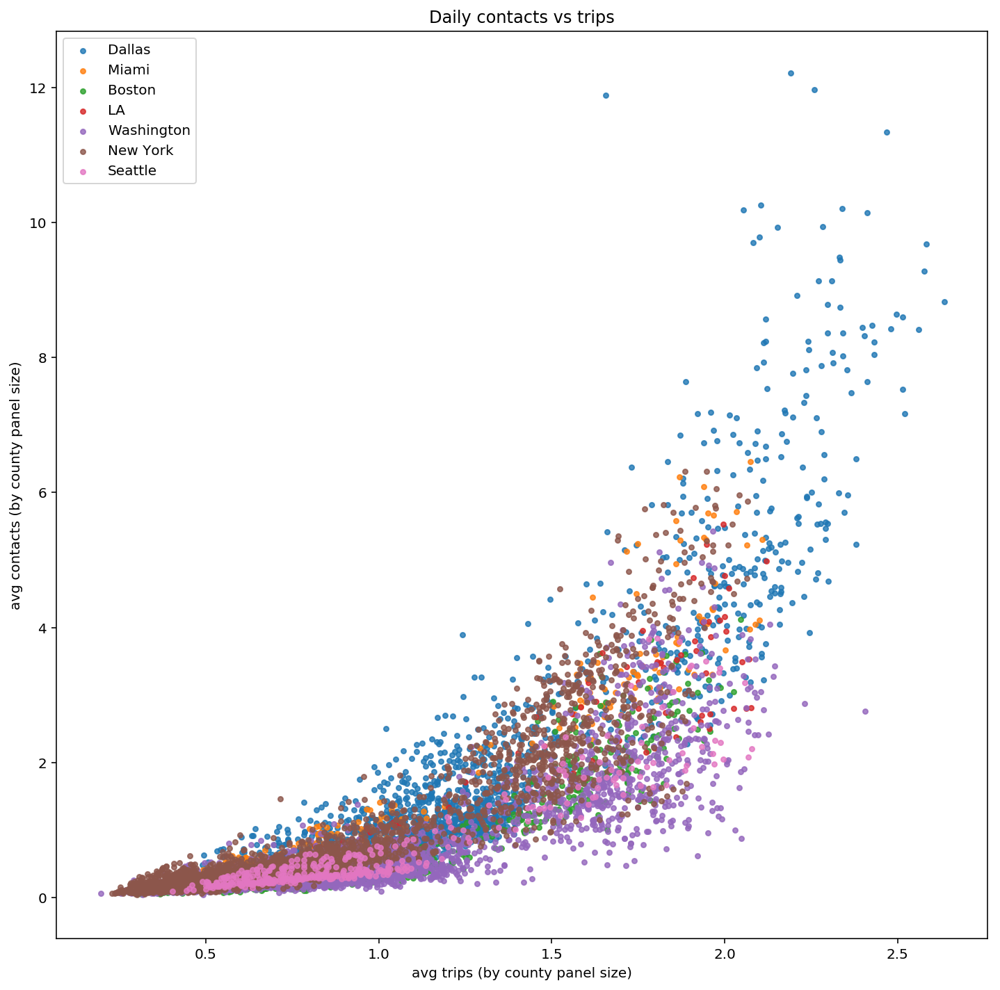

In [188]:
figure, ax = plt.subplots(figsize=(12, 12))
s=12

for metro_area,df in metro_area_to_county_data.items():
    x = df[AVG_TRIPS]
    y = df[AVG_CONTACTS]
    ax.scatter(
        x,
        y,
        s=12,
        label=metro_area,
        alpha=0.8,
    )
ax.set_xlabel("avg trips (by county panel size)")
ax.set_ylabel("avg contacts (by county panel size)")
title = 'Daily contacts vs trips'
ax.set_title(title)
plt.legend()
plt.show()

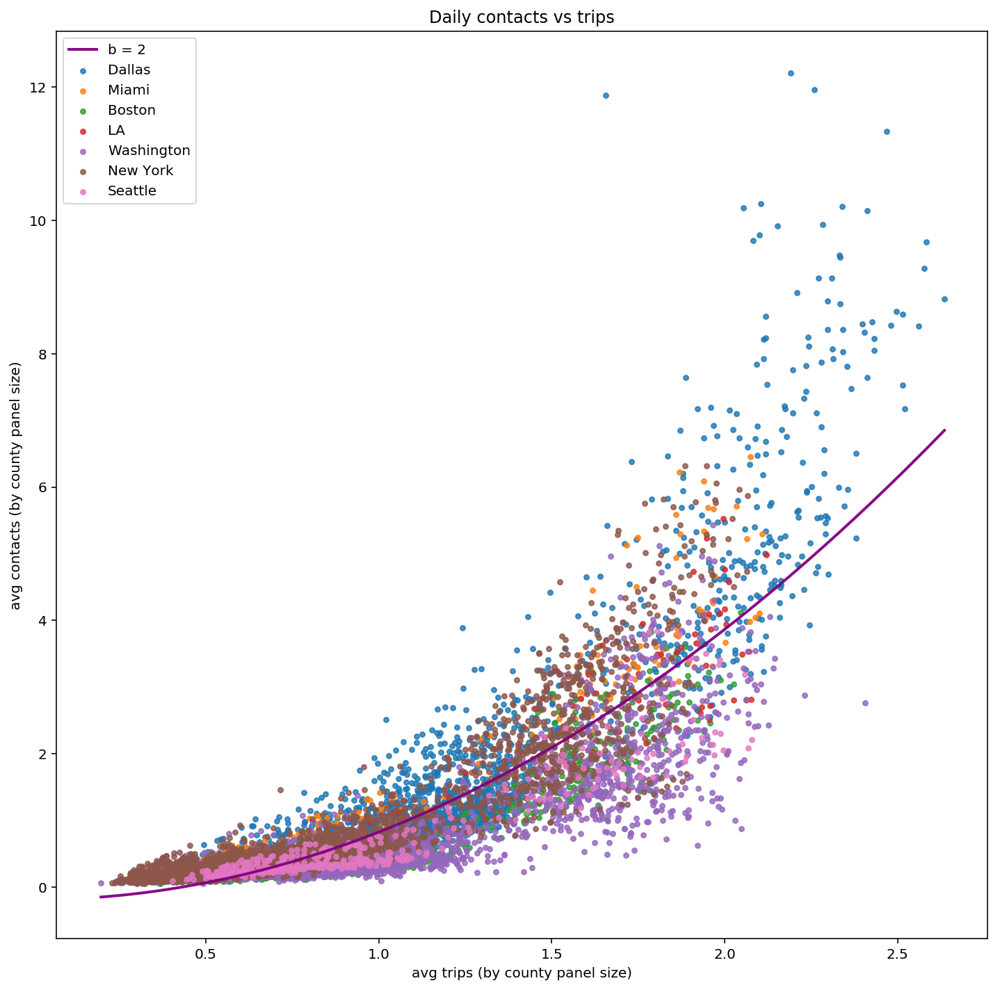

In [190]:
# same as above, but add line fitted to exponent as 2, but  fitted  to all the data  at once

figure, ax = plt.subplots(figsize=(12, 12))
s=12

xx, yy, xx2 = None, None, None

for metro_area,df in metro_area_to_county_data.items():
    x = df[AVG_TRIPS]
    y = df[AVG_CONTACTS]
    ax.scatter(
        x,
        y,
        s=12,
        label=metro_area,
        alpha=0.8,
    )
    
    x2 = x**2
    if xx is None:
        xx,yy,xx2 = x,y,x2
    else:
        xx = xx.append(x)
        yy = yy.append(y)
        xx2 = xx2.append(x2)
    
b, intercept, r_value, p_value, std_err = stats.linregress(xx2.values,yy.values)
y_pred2 = intercept + b*(xx2)
sorted_x2 = xx.sort_values()
sorted_y_pred2 = y_pred2.sort_values()
# sq line
ax.plot(
    sorted_x2,
    sorted_y_pred2,
    c='purple', zorder=1, alpha=.95, linewidth=2,
    label='b = 2'
)
    
    
ax.set_xlabel("avg trips (by county panel size)")
ax.set_ylabel("avg contacts (by county panel size)")
title = 'Daily contacts vs trips'
ax.set_title(title)
plt.legend()
plt.show()

## Compare 3  time periods

up to March 13 vs March 14 - April 14 vs After April 14 


In [191]:
date1 = '2020-03-14'
date2 = '2020-04-25'

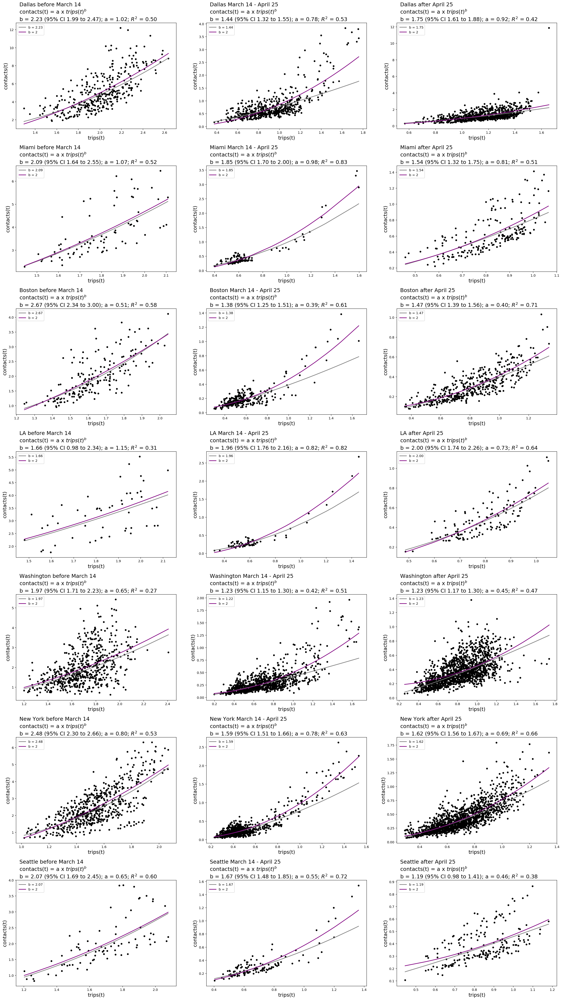

In [192]:
ncols = 3
nrows = int(np.ceil(float(len(metro_area_to_data))))
figure, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(24, nrows*6))
plt.subplots_adjust(hspace=0.5)

def f_date(date):
    return datetime.datetime.strptime(date, date_fmt).strftime("%B %d")

for i, (metro_area, df) in enumerate(metro_area_to_county_data.items()):
    p1_df = df[df[DAY] < date1]
    p2_df = df[(df[DAY] >= date1) & (df[DAY] < date2)]
    p3_df = df[(df[DAY] >= date2)]
    
    p1_name = '%s before %s' % (metro_area, f_date(date1))
    p2_name = '%s %s - %s' % (metro_area, f_date(date1), f_date(date2))
    p3_name = '%s after %s' % (metro_area, f_date(date2))
    (p1_b, p1_a, p1_r_sq, p1_CI_95) = regression_plot(axes.flat[3*i], p1_name, p1_df)
    (p2_b, p2_a, p2_r_sq, p2_CI_95) = regression_plot(axes.flat[3*i+1], p2_name, p2_df)
    if len(p3_df):
        (p3_b, p3_a, p3_r_sq, p3_CI_95) = regression_plot(axes.flat[3*i+2], p3_name, p3_df)

plt.tight_layout()
plt.show()

Redo previous boxplots for different periods

i.e. run 

$$contacts(t) \sim a \times trips(t)^b$$

for each county  separately to estimate separate a, b values for each of the 3 periods and show boxplots or histograms.





In [193]:
MONTH = 'month'
MONTH_NAME = 'month name'
metro_county_contacts_trips[MONTH] = pd.to_datetime(metro_county_contacts_trips[DAY],format=date_fmt).apply(lambda d: d.month)

In [194]:
metro_county_contacts_trips.head()

,contacts,county FIPS,day,trips,avg contacts,avg trips,log avg contacts,log avg trips,metro area,population density,name,month
0,300169.0,48085,2020-02-17,108837.0,5.052244,1.831872,1.619833,0.605338,Dallas,0.000433,"Collin County, Texas",2
1,243605.0,48113,2020-02-17,144136.0,3.250797,1.923429,1.178900,0.654110,Dallas,0.001145,"Dallas County, Texas",2
2,272963.0,48121,2020-02-17,97936.0,5.242534,1.880961,1.656805,0.631783,Dallas,0.000354,"Denton County, Texas",2
3,46996.0,48139,2020-02-17,24333.0,3.983725,2.062643,1.382217,0.723988,Dallas,0.000070,"Ellis County, Texas",2
4,8033.0,48221,2020-02-17,6673.0,2.275637,1.890368,0.822260,0.636772,Dallas,0.000052,"Hood County, Texas",2


In [195]:
# end up with df with columns
# month,metro area,fips,a,b,

m_df=None

month_ints  = [2,3,4,5]
m_fips_records = []
fips_list = metro_county_contacts_trips[FIPS].unique().tolist()

for month_int in month_ints:
    d = datetime.date(2020, month_int, 1)
    month = d.strftime('%B')
    print(month)
    m_df = metro_county_contacts_trips[metro_county_contacts_trips[MONTH]==month_int]
    
    for f in fips_list:
        f_df = m_df[m_df[FIPS]==f]
        if not len(f_df):
            continue
        metro_areas = f_df[METRO_AREA].unique().tolist()
        assert(len(metro_areas)==1)
        metro_area = metro_areas[0]
        a,b,r_sq, CI_95 = run_regression(f_df)
        month_county_regression_dict = {
            METRO_AREA:metro_area,
            FIPS:f,
            ALPHA: a,
            BETA: b,
            MONTH:month_int,
            MONTH_NAME:month,
        }
        m_fips_records += [month_county_regression_dict]
        
    

m_county_regression_results_df = pd.DataFrame(m_fips_records)
m_county_regression_results_df.head(2)
    

February
March
April
May


,a,b,county FIPS,metro area,month,month name
0,1.594633,2.219545,48085,Dallas,2,February
1,0.311806,3.431300,48113,Dallas,2,February


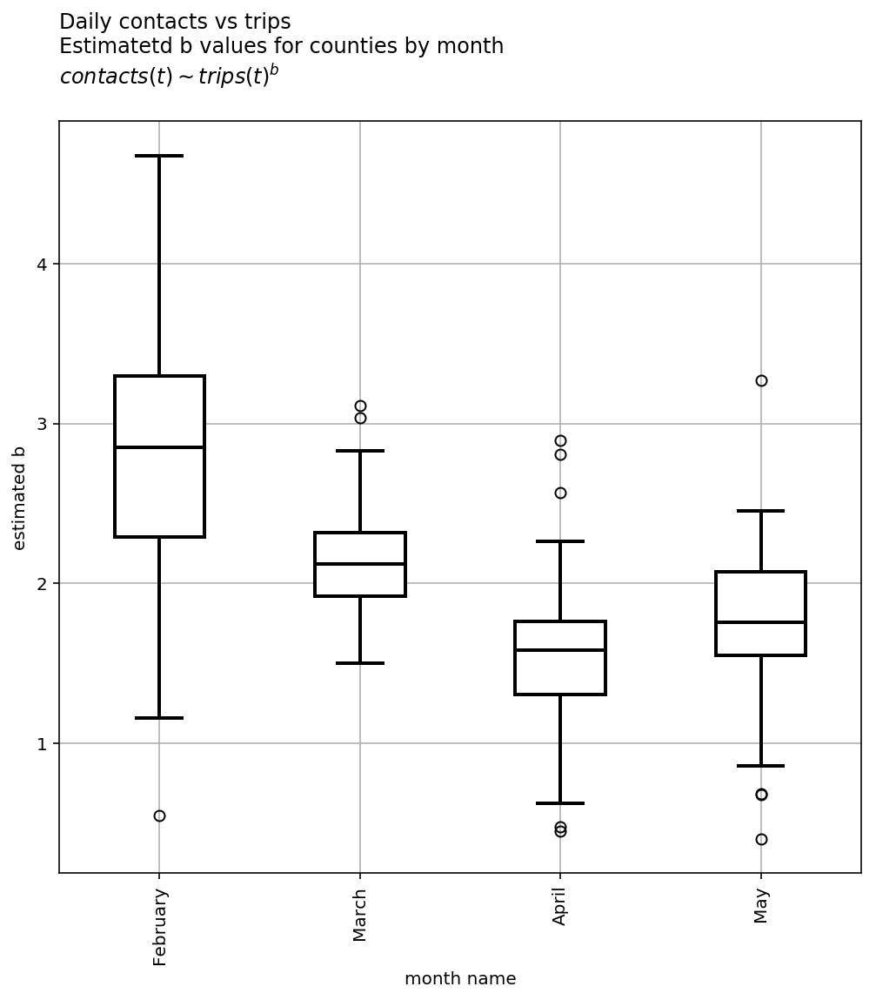

In [196]:
# boxplot
figure, ax = plt.subplots(figsize=(8, 8))

bp = m_county_regression_results_df.boxplot(
    column=BETA,
    by=MONTH_NAME,
    positions=[2,0,1,3],
    ax=ax,
    return_type='dict',
    rot=90,
    patch_artist=True,
    )

linewidth=2

[[item.set_color('black') for item in bp[key]['boxes']] for key in bp.keys()]
[[item.set_facecolor('white') for item in bp[key]['boxes']] for key in bp.keys()]
[[item.set_color('black') for item in bp[key]['fliers']] for key in bp.keys()]
[[item.set_color('black') for item in bp[key]['medians']] for key in bp.keys()]
[[item.set_color('black') for item in bp[key]['whiskers']] for key in bp.keys()]
[[item.set_linewidth(linewidth) for item in bp[key]['boxes']] for key in bp.keys()]
[[item.set_linewidth(linewidth) for item in bp[key]['fliers']] for key in bp.keys()]
[[item.set_linewidth(linewidth) for item in bp[key]['medians']] for key in bp.keys()]
[[item.set_linewidth(linewidth) for item in bp[key]['whiskers']] for key in bp.keys()]
[[item.set_linewidth(linewidth) for item in bp[key]['caps']] for key in bp.keys()]

# plt.xticks(rotation=90)
ax.set_ylabel('estimated b')

title = ('Daily contacts vs trips\n' + \
         'Estimatetd b values for counties by month\n' + \
        '$contacts(t) \sim trips(t)^b$\n')
plt.title('')
plt.suptitle('')
ax.set_title(title,
             loc='left', # left align
            )
plt.show()

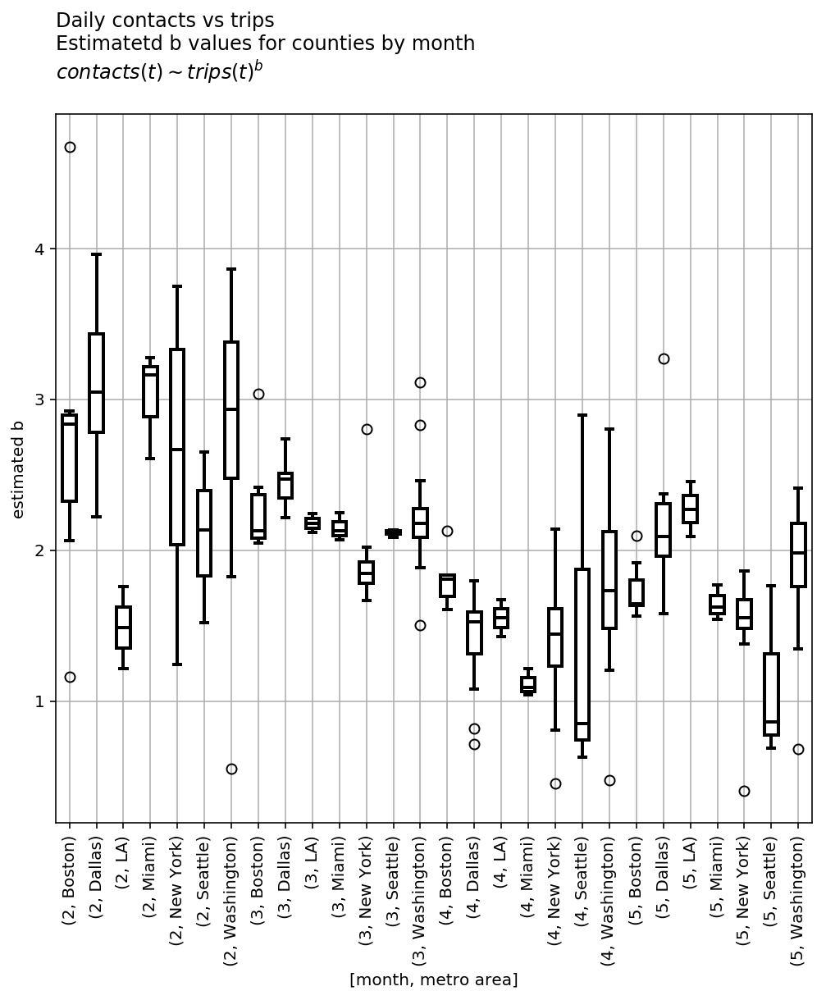

In [197]:
# boxplot
figure, ax = plt.subplots(figsize=(8, 8))

bp = m_county_regression_results_df.boxplot(
    column=BETA,
    by=[MONTH,METRO_AREA],
    ax=ax,
    #grid=False,
    return_type='dict',
    rot=90,
    patch_artist=True,
    )

linewidth=2

[[item.set_color('black') for item in bp[key]['boxes']] for key in bp.keys()]
[[item.set_facecolor('white') for item in bp[key]['boxes']] for key in bp.keys()]
[[item.set_color('black') for item in bp[key]['fliers']] for key in bp.keys()]
[[item.set_color('black') for item in bp[key]['medians']] for key in bp.keys()]
[[item.set_color('black') for item in bp[key]['whiskers']] for key in bp.keys()]
[[item.set_linewidth(linewidth) for item in bp[key]['boxes']] for key in bp.keys()]
[[item.set_linewidth(linewidth) for item in bp[key]['fliers']] for key in bp.keys()]
[[item.set_linewidth(linewidth) for item in bp[key]['medians']] for key in bp.keys()]
[[item.set_linewidth(linewidth) for item in bp[key]['whiskers']] for key in bp.keys()]
[[item.set_linewidth(linewidth) for item in bp[key]['caps']] for key in bp.keys()]

# plt.xticks(rotation=90)
ax.set_ylabel('estimated b')

title = ('Daily contacts vs trips\n' + \
         'Estimatetd b values for counties by month\n' + \
        '$contacts(t) \sim trips(t)^b$\n')
plt.title('')
plt.suptitle('')
ax.set_title(title,
             loc='left', # left align
            )
plt.show()

In [198]:
metro_county_contacts_trips.head()

,contacts,county FIPS,day,trips,avg contacts,avg trips,log avg contacts,log avg trips,metro area,population density,name,month
0,300169.0,48085,2020-02-17,108837.0,5.052244,1.831872,1.619833,0.605338,Dallas,0.000433,"Collin County, Texas",2
1,243605.0,48113,2020-02-17,144136.0,3.250797,1.923429,1.178900,0.654110,Dallas,0.001145,"Dallas County, Texas",2
2,272963.0,48121,2020-02-17,97936.0,5.242534,1.880961,1.656805,0.631783,Dallas,0.000354,"Denton County, Texas",2
3,46996.0,48139,2020-02-17,24333.0,3.983725,2.062643,1.382217,0.723988,Dallas,0.000070,"Ellis County, Texas",2
4,8033.0,48221,2020-02-17,6673.0,2.275637,1.890368,0.822260,0.636772,Dallas,0.000052,"Hood County, Texas",2


In [199]:
metro_county_contacts_trips_p1 = metro_county_contacts_trips[metro_county_contacts_trips[DAY] < date1]
metro_county_contacts_trips_p2 = metro_county_contacts_trips[(metro_county_contacts_trips[DAY] >= date1) & (metro_county_contacts_trips[DAY] < date2)]
metro_county_contacts_trips_p3 = metro_county_contacts_trips[metro_county_contacts_trips[DAY] >= date2]

In [200]:
# check if there is a change in b values over the periods, when regressed over all  metros together

for df in [metro_county_contacts_trips_p1,metro_county_contacts_trips_p2,metro_county_contacts_trips_p3]:
    a,b,r_sq, CI_95 = run_regression(df)
    print(a,b,r_sq, CI_95)


(0.6659478759809742, 2.4657279157295147, 0.47331734531604047, [2.3509849826541322, 2.580470848804897])
(0.5818776130957429, 1.4237918513403616, 0.5983765006578864, [1.3828218891292012, 1.464761813551522])
(0.6329622975726904, 1.7331964332963468, 0.6081942532423337, [1.6940933839993506, 1.772299482593343])


In [201]:
# same thing but separate by metro area

for metro_area in metro_area_to_county_data.keys():
    print('metro area:', metro_area)
    for df in [metro_county_contacts_trips_p1,metro_county_contacts_trips_p2,metro_county_contacts_trips_p3]:
        m_df = df[df[METRO_AREA]==metro_area]        
        if not len(m_df):
            continue
        a,b,r_sq, CI_95 = run_regression(m_df)
        print(a,b,r_sq, CI_95)

('metro area:', 'Dallas')
(1.0183869306482565, 2.2328602252143503, 0.5010536470341468, [1.9946102946993638, 2.471110155729337])
(0.7841459772605481, 1.4371865830965502, 0.524614459364282, [1.3208209274501503, 1.5535522387429501])
(0.9197571149194973, 1.7453147569491874, 0.4236047828828487, [1.6068081333282407, 1.883821380570134])
('metro area:', 'Miami')
(1.0742144481453904, 2.0943728835583935, 0.5213779533073254, [1.64322045464, 2.5455253124767867])
(0.9787900932756629, 1.8534323439458738, 0.8264387921913233, [1.7020897726053723, 2.0047749152863754])
(0.8136437297568281, 1.5371979364405932, 0.5084721985264036, [1.3222914612326235, 1.752104411648563])
('metro area:', 'Boston')
(0.5096167849116447, 2.6740434373127546, 0.5839953985838657, [2.3443330488334753, 3.003753825792034])
(0.3910822002649682, 1.380623039483809, 0.6058788555770261, [1.2513432229079484, 1.5099028560596697])
(0.39724896318931646, 1.474034695416556, 0.7060210394540077, [1.385758084543637, 1.562311306289475])
('metro a

Calculate the a, b values over all counties together but on separate days and then plot the change  in b values over time.



In [203]:
BETA_95_LOW='b 95 low'
BETA_95_HIGH='b 95 high'

d_records = []

for d in dates:
    d_df = metro_county_contacts_trips[metro_county_contacts_trips[DAY]==d]
    if not len(d_df):
        break
    a,b,r_sq, CI_95 = run_regression(d_df)
    
    d_record = {
        DAY:d,
        ALPHA:a,
        BETA:b,
        BETA_95_LOW: CI_95[0],
        BETA_95_HIGH: CI_95[1],
        'r_sq':r_sq
    }
    d_records += [d_record]


In [204]:
day_regression_results_df = pd.DataFrame(d_records)
day_regression_results_df.head()

,a,b,b 95 high,b 95 low,day,r_sq
0,1.380241,1.247306,1.814664,0.679948,2020-02-17,0.200580
1,0.757939,2.046133,2.754091,1.338175,2020-02-18,0.302477
2,0.804039,2.006155,2.769831,1.242479,2020-02-19,0.263761
3,0.681017,2.227880,3.026069,1.429691,2020-02-20,0.287972
4,0.710912,2.148202,2.795258,1.501146,2020-02-21,0.363948


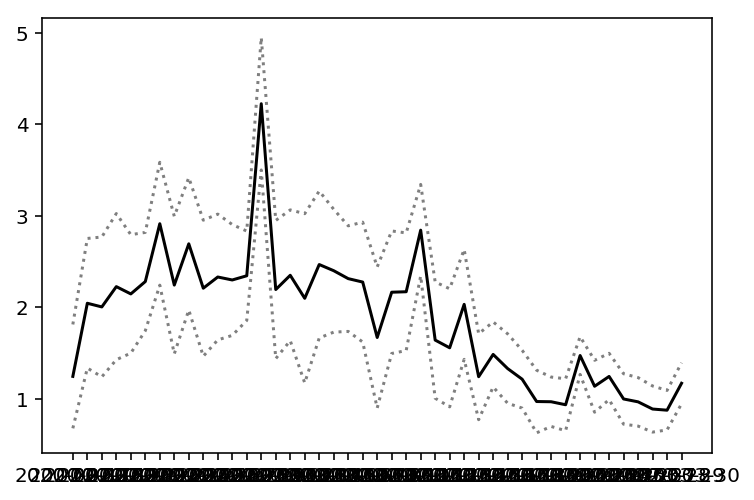

In [205]:
from matplotlib.dates import date2num, num2date
from matplotlib import dates as mdates
from matplotlib import ticker
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch



figure,ax = plt.subplots()
b=day_regression_results_df[BETA]
b_95_high = day_regression_results_df[BETA_95_HIGH]
b_95_low = day_regression_results_df[BETA_95_LOW]

dates=day_regression_results_df[DAY]
ax.plot(
    dates,
    b,
    c='k',
    # linestyle=':',
    #alpha=.5,
    label='b values')

ax.plot(
    dates,
    b_95_high,
    c='k',
    linestyle=':',
    alpha=.5,
    label='95% CI')

ax.plot(
    dates,
    b_95_low,
    c='k',
    linestyle=':',
    alpha=.5,
    label='95% CI')

# Formatting
# ax.xaxis.set_major_locator(mdates.MonthLocator())
# ax.xaxis.set_major_formatter(mdates.DateFormatter('%b'))
# ax.xaxis.set_minor_locator(mdates.DayLocator())

In [207]:
fips_records_1 = []
for metro_area,df in metro_area_to_county_data.items():
    area_id = metro_area_to_id[metro_area]
    print('metro area:', metro_area, area_id)
    user_fips = get_panel_user_county_fips(area_id)
    fips_panel_size_dict = user_fips.value_counts().to_dict()
    metro_fips = user_fips.unique()
    for f in metro_fips:
        f_df = df[df[FIPS]==f]
        a,b,r_sq, CI_95 = run_regression(f_df)
        county_regression_dict = {
            METRO_AREA:metro_area,
            FIPS:f,
            PANEL_SIZE: fips_panel_size_dict[f],
            ALPHA: a,
            BETA: b,
        }
        fips_records += [county_regression_dict]

metro_county_regression_results_p1_df = pd.DataFrame(fips_records)
metro_county_regression_results_df.head()

('metro area:', 'Dallas', 19100)
('metro area:', 'Miami', 33100)
('metro area:', 'Boston', 14460)
('metro area:', 'LA', 31080)
('metro area:', 'Washington', 47900)
('metro area:', 'New York', 35620)
('metro area:', 'Seattle', 42660)


,a,b,county FIPS,metro area,panel size
0,1.282813,2.167903,48121,Dallas,52074
1,0.699157,2.302165,48113,Dallas,74926
2,0.969979,2.287157,48439,Dallas,92311
3,0.773894,2.476110,48251,Dallas,11552
4,1.401800,2.255426,48085,Dallas,59425


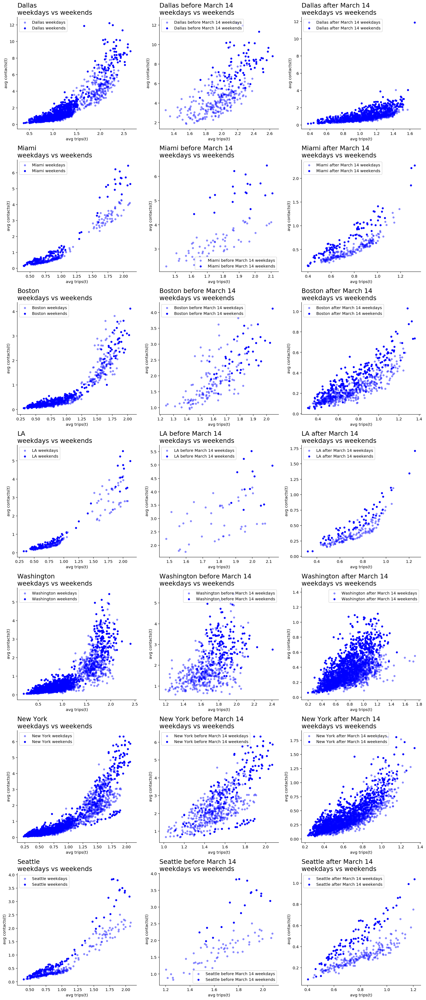

In [208]:
# plot weekends vs weekdays

ncols = 3
nrows = len(metro_area_to_data)
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, nrows*5))
plt.subplots_adjust(hspace=0.5)

for i, (metro_area, metro_df) in enumerate(metro_area_to_county_data.items()):
    [ax1,ax2,ax3] = [axes.flat[3*i],axes.flat[3*i+1], axes.flat[3*i+2]]
    # ax1: all together
    plot_weekend_vs_weekday_df(metro_df, metro_area, ax1)
    # excluding  March 14 which is an outlier
    before_lockdown_df = metro_df[metro_df[DAY] < '2020-03-14']
    after_lockdown_df = metro_df[metro_df[DAY] > '2020-03-14']
    plot_weekend_vs_weekday_df(before_lockdown_df, '%s before March 14'%metro_area, ax2)
    plot_weekend_vs_weekday_df(after_lockdown_df, '%s after March 14'%metro_area, ax3)
    
   
plt.tight_layout()
plt.show()

In [209]:
metro_area='New York'
df = metro_area_to_county_data[metro_area]
df.head(3)

,contacts,county FIPS,day,trips,avg contacts,avg trips,log avg contacts,log avg trips,metro area
0,154627.0,34003,2020-02-17,58588.0,4.259345,1.613861,1.449115,0.478630,New York
1,63008.0,34013,2020-02-17,32410.0,3.083488,1.586082,1.126062,0.461267,New York
2,39096.0,34017,2020-02-17,22543.0,2.655798,1.531350,0.976745,0.426150,New York


In [184]:
df[POP_DENSITY] = df[FIPS].astype(str).map(fips_to_pop_density)
df[LOG_POP_DENSITY] = np.log(df[POP_DENSITY])
df.head()

,contacts,county FIPS,day,trips,avg contacts,avg trips,log avg contacts,log avg trips,population density,log population density
0,155587.0,34003,2020-02-17,58826.0,4.285789,1.620417,1.455305,0.482684,0.001543,-6.474342
1,63587.0,34013,2020-02-17,32566.0,3.111823,1.593716,1.135209,0.466069,0.002430,-6.019838
2,39316.0,34017,2020-02-17,22637.0,2.670742,1.537735,0.982357,0.430311,0.005589,-5.187017
3,5095.0,34019,2020-02-17,3397.0,1.964148,1.309561,0.675059,0.269692,0.000113,-9.089415
4,112202.0,34023,2020-02-17,48561.0,3.910159,1.692316,1.363578,0.526098,0.001032,-6.876007


In [200]:
fips_to_name_dict = fips_to_name.to_dict()

('fips', '34003')
('fips', '34013')
('fips', '34017')
('fips', '34019')
('fips', '34023')
('fips', '34025')
('fips', '34027')
('fips', '34029')
('fips', '34031')
('fips', '34035')
('fips', '34037')
('fips', '34039')
('fips', '36005')
('fips', '36047')
('fips', '36059')
('fips', '36061')
('fips', '36071')
('fips', '36079')
('fips', '36081')
('fips', '36085')
('fips', '36087')
('fips', '36103')
('fips', '36119')
('fips', '42103')


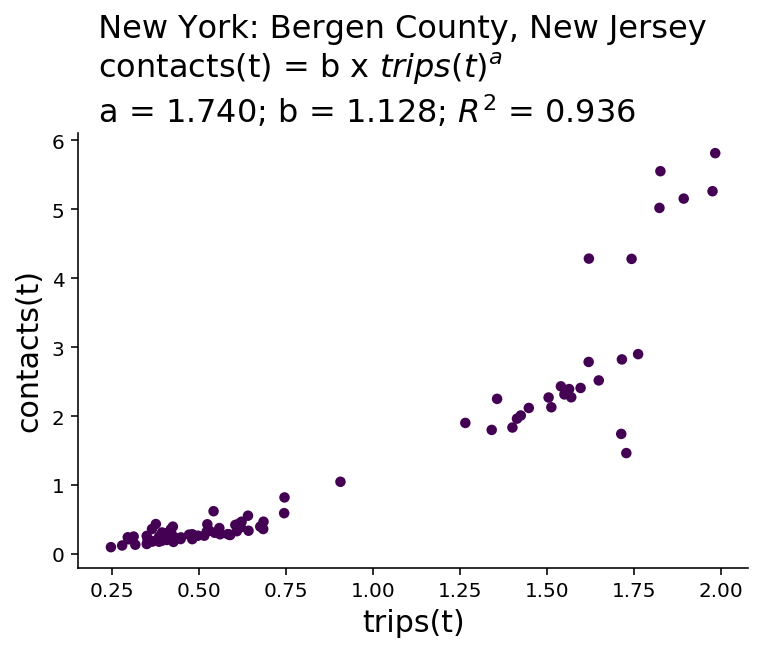

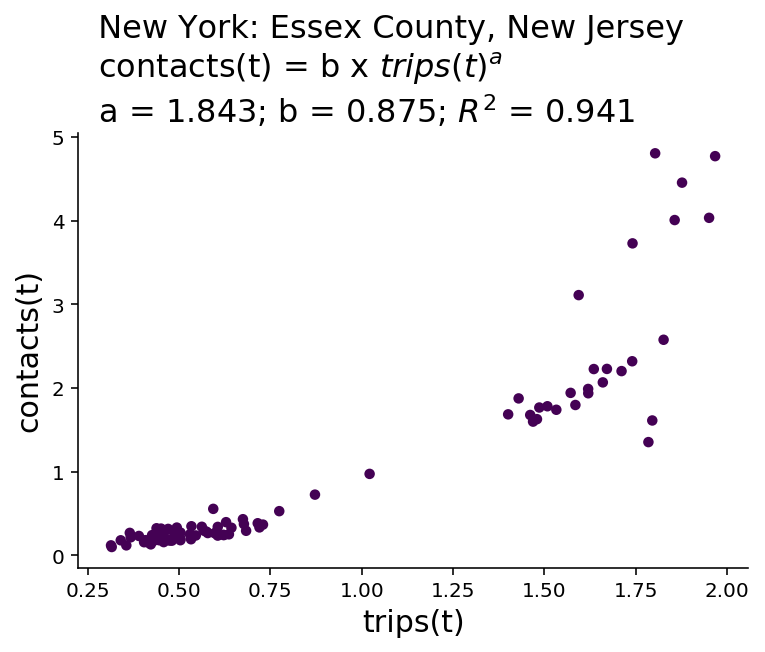

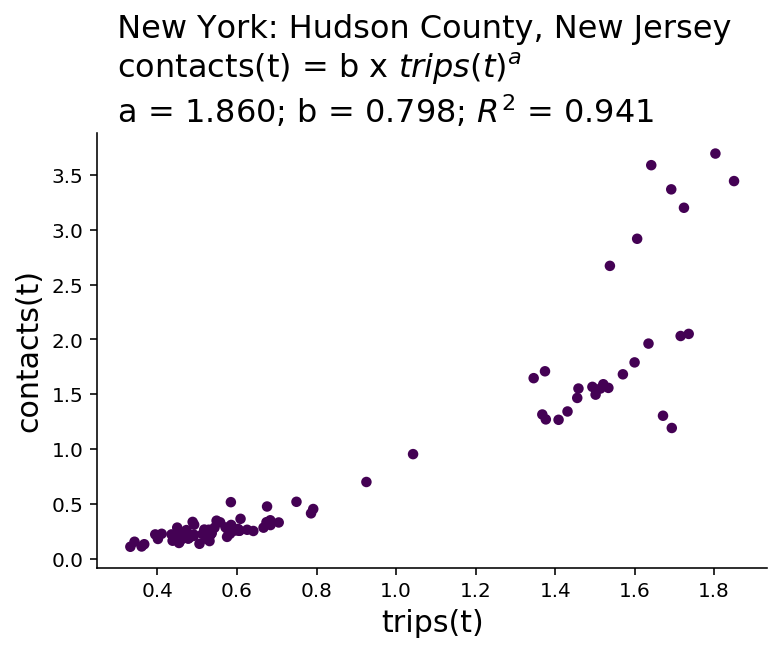

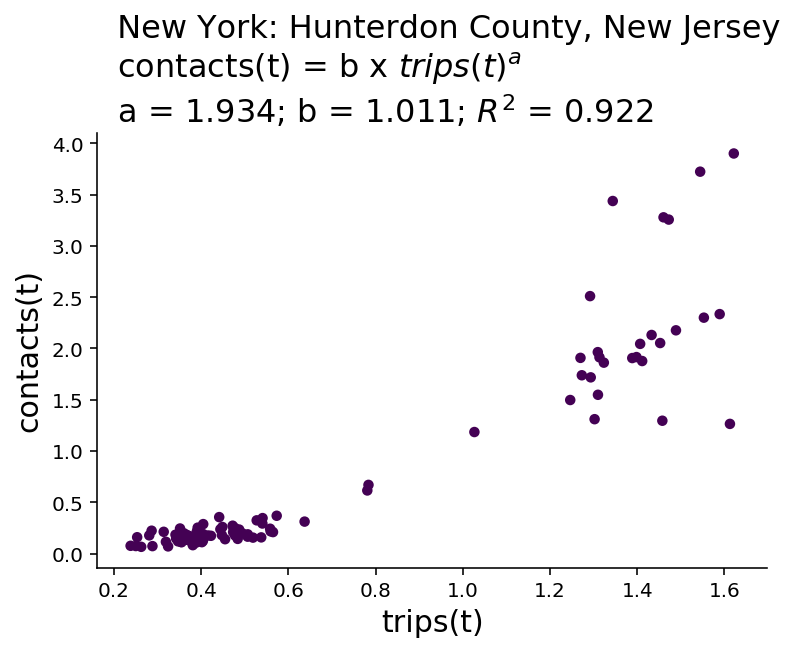

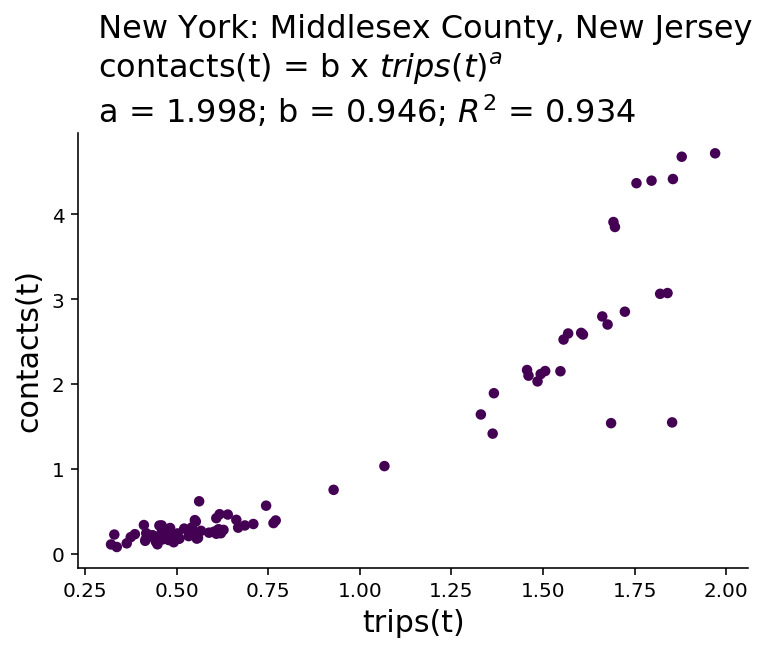

...

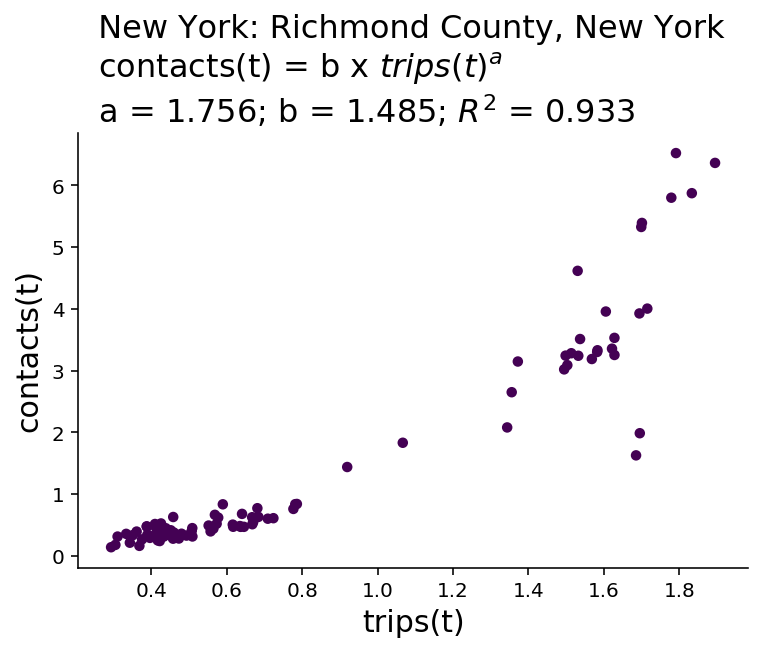

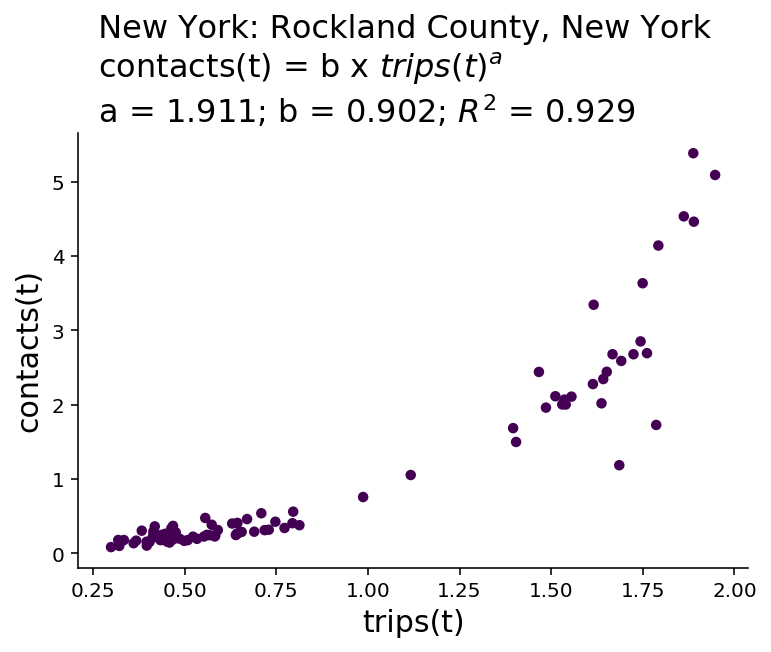

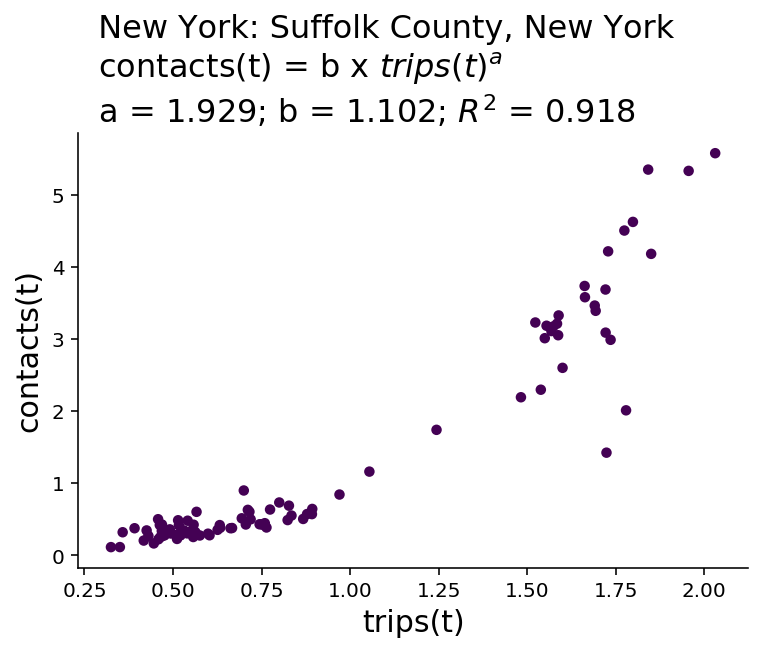

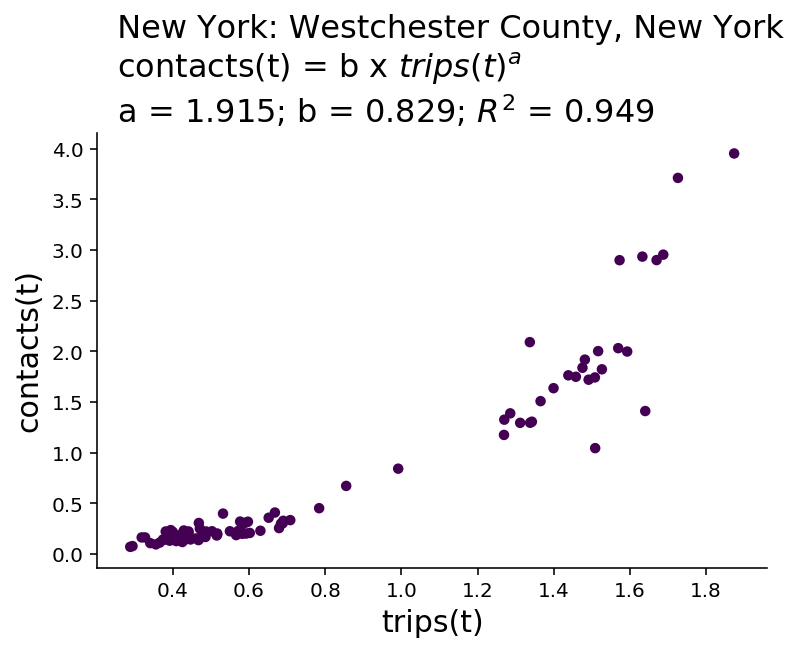

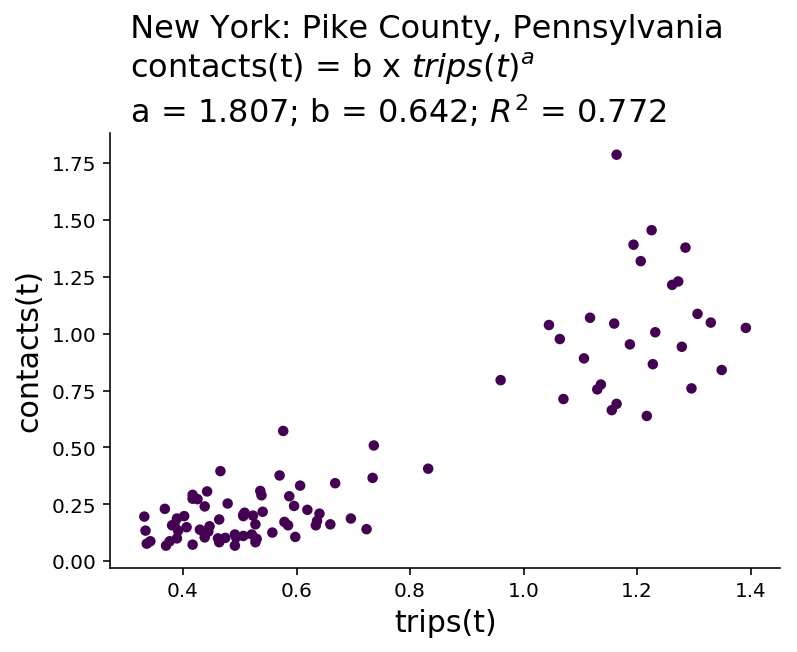

In [205]:
df[FIPS] = df[FIPS].astype(str)
fips_list = df[FIPS].unique()
colors = np.linspace(0, 1, len(fips_list))
colordict = dict(zip(fips_list, colors))
for fips in fips_list:
    print('fips', fips)
    df_fips = df[df[FIPS]==fips]
    figure, axes = plt.subplots()#figsize=(6, 6))
    name=fips_to_name_dict[fips]
    (alpha, beta, r_square_score) = fips_regression_plot(axes, metro_area, df_fips, name)